In [5]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import plotly.express as px
import pandas as pd
from pathlib import Path
from scipy.signal import convolve
from scipy.signal.windows import triang
from sklearn.decomposition import PCA
from scipy import stats


In [6]:
# useful for plotting
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6

In [7]:
# loading the data
spike_rows = []

for file in Path("./").glob("*.nio"):
    print(f"Leggo: {file.name}")
    reader = neo.io.NixIO(filename=str(file), mode="ro")
    block = reader.read_block()

    for seg_idx, segment in enumerate(block.segments):
        for st_idx, spiketrain in enumerate(segment.spiketrains):
            spike_times = spiketrain.times.rescale("ms").magnitude
            senders = spiketrain.annotations.get("senders", None)
            device = spiketrain.annotations.get("device", "unknown")
            pop_size = spiketrain.annotations.get("pop_size", None)

            if senders and len(senders) == len(spike_times):
                for time, sender in zip(spike_times, senders):
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": sender,
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })
            else:
                for time in spike_times:
                    spike_rows.append({
                        "time_ms": time,
                        "sender_id": f"unit{st_idx}",
                        "pop": device.split('_')[0],
                        "segment": seg_idx,
                        "file": file.name
                    })

df_spikes = pd.DataFrame(spike_rows)
print("Pops:", df_spikes['pop'].unique())

Leggo: f5d958d9-6c30-44be-8757-ebd3421a4600.nio
Leggo: 889130cd-c4c6-49d4-9d9c-58d54698c942.nio
Leggo: 8a2b111a-4a89-4c11-8de4-c016ef0e0984.nio
Leggo: 96e1e91c-1573-4c53-a434-e7b0ec8c0e01.nio
Leggo: 82b0c816-2904-44b9-9e62-bdebef72af84.nio
Leggo: db7b6d82-5fdf-4300-a42b-5259c8faf815.nio
Leggo: ae9d7dd5-d037-46db-a427-11e42709917e.nio
Leggo: c7dea197-26e5-46ac-afed-3dab340f79e3.nio
Pops: ['mossy' 'glomerulus' 'granule' 'golgi' 'purkinje' 'basket' 'stellate'
 'background']


In [8]:
df_spikes.head()

,time_ms,sender_id,pop,segment,file
0,31.3,97,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
1,35.0,41,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
2,48.6,113,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
3,65.3,17,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio
4,69.5,9,mossy,0,f5d958d9-6c30-44be-8757-ebd3421a4600.nio


## Analysis of Purkinje cells

In [9]:
# maschera PC e id cells
df_analysis_pc = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]
df_analysis_pc

,time_ms,sender_id
74802,7.6,32985
74803,8.5,32977
74804,8.9,32953
74805,9.0,32993
74806,9.2,32961
...,...,...
642702,4986.8,32967
642703,4990.9,32975
642704,4991.1,32951
642705,4992.6,33007


In [10]:
num_neurons = df_spikes[df_spikes['pop']=='purkinje'][['time_ms', 'sender_id']]['sender_id'].unique().shape
print("Number of neurons:", num_neurons)

Number of neurons: (68,)


In [11]:
# dataframe -> numpy array
purkinje_spikes = np.array(df_analysis_pc)
print("Shape:", purkinje_spikes.shape) # first column is time, second is cell id
print(purkinje_spikes)

Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]


In [12]:
spike_times_pc = df_spikes[df_spikes['pop']=='purkinje'][['time_ms']].values
print("Spike times:", spike_times_pc.shape)
print("Spike times:", spike_times_pc[:10])
print("Spike times dtype:", spike_times_pc.dtype)

Spike times: (15825, 1)
Spike times: [[ 7.6]
 [ 8.5]
 [ 8.9]
 [ 9. ]
 [ 9.2]
 [ 9.3]
 [ 9.8]
 [10. ]
 [24.1]
 [26. ]]
Spike times dtype: float64


In [13]:
neurons_pc = df_spikes[df_spikes['pop']=='purkinje'][['sender_id']].values
print("Neurons:", neurons_pc.shape)
print("Neurons:", neurons_pc[:10])

Neurons: (15825, 1)
Neurons: [[32985]
 [32977]
 [32953]
 [32993]
 [32961]
 [33001]
 [33009]
 [32969]
 [32985]
 [32993]]


In [14]:
def compute_firing_rate(spiking_data: np.array, t_start=0, t_end=None, dt=0.1, sigma=100, compute_stats=True, mask_flag=True):
    """
    Args:
        - Spiking_data: 2D numpy array with shape (N, 2), where N is the number of spikes
        and the first column is spike times and the second column is neuron IDs.
        - t_start : start time in ms
        - t_end : end time in ms, will be defaulted to the maximum spike time + 1
        - dt : time step in ms
        - sigma : standard deviation of the triangular kernel in ms
    Returns:
        - times_vector : The time points at which firing rates are calculated (in ms)
        - rate : The average firing rate across active neurons at each time point (in Hz)
        - rates_array : 2D numpy array with shape (num_neurons, num_bins), with firing rates for each neuron at each time point
        - stats_dict : dictionary with mean, std, max, min firing rates (if compute_stats is True)
    """
    if isinstance(spiking_data, np.ndarray) and len(spiking_data.shape) == 2:
        times = spiking_data[:, 0]
        ids = spiking_data[:, 1]
    else:
        print("Invalid input data format. Expected a 2D numpy array.")
        return None
    
    # Filtering unique neurons
    neurons_ids = np.unique(ids)
    num_neurons = neurons_ids.shape[0]
    print("Number of neurons:", num_neurons)
    
    # Creating the time vector
    if t_end is None:
        t_end = times.max() + 1  # Fixed: was spike_times.max()

    print("Time vector:", t_start, t_end)
    
    times_vector = np.arange(t_start, t_end, dt)
    num_bins = times_vector.shape[0]
    print("Number of bins:", num_bins)

    # Creating the kernel
    kernel_size = int(2 * sigma / dt)
    kernel_size = max(kernel_size, 3)  # At least 3 points wide
    kernel = triang(kernel_size)
    kernel = kernel / np.sum(kernel)  # Normalizing the kernel
    print("Kernel size:", kernel_size)
    
    # Calculate rate for each neuron separately
    rates_per_neuron = []
    active_neurons = 0
    
    for i, neuron_id in enumerate(neurons_ids):
        neuron_spikes = times[ids == neuron_id]
        
        if len(neuron_spikes) == 0:
            continue  # Skip neurons with no spikes (matches their approach)
        
        active_neurons += 1
        if i < 3:  # Print details for first few neurons only
            print(f"Neuron ID: {neuron_id}")
            print(f"First few spikes: {neuron_spikes[:5]}")
        
        # Create spike train for this neuron
        single_neuron_train = np.zeros_like(times_vector)
        positions = (neuron_spikes / dt).astype(int)
        positions = positions[positions < num_bins]  # Remove spikes outside time range
        single_neuron_train[positions] = 1
        
        # Calculate firing rate for this neuron
        single_rate = convolve(single_neuron_train, kernel, mode='same') * (1000.0 / dt)
        rates_per_neuron.append(single_rate)
    
    # Stack all rates and calculate mean
    if not rates_per_neuron:
        print("No active neurons found!")
        return None
        
    rates_array = np.vstack(rates_per_neuron) # Shape: (num_neurons, num_bins)
    print("Rates array shape:", rates_array.shape)
    print("Rates array first few values:", rates_array[:5])
    print("Rates array first few neurons:", rates_array[:, :5])
    rate = np.mean(rates_array, axis=0)
    print("Rate shape:", rate.shape)
    print("Rate first few values:", rate[:5])

    if mask_flag:
        window_start = 250
        window_end = times_vector[-1] - 250
        mask = (times_vector >= window_start) & (times_vector <= window_end)
        rate = rate[mask]
        rates_array = rates_array[:, mask]
        times_vector = times_vector[mask]
    
    print("---"*20)
    print(f"Active neurons: {active_neurons} out of {num_neurons}")
    print("Firing rate shape:", rate.shape)
    print("Firing rate first few values:", rate[:5])
    
    if compute_stats:
        mean_rate = np.mean(rate)
        std_rate = np.std(rate)
        max_rate = np.max(rate)
        min_rate = np.min(rate)
        print(f"Mean firing rate: {mean_rate:.4f}+/-{std_rate:.4f}")
        print(f"Max firing rate: {max_rate:.4f}")
        print(f"Min firing rate: {min_rate:.4f}")
        stats_dict = {
            'mean': mean_rate,
            'std': std_rate,
            'max': max_rate,
            'min': min_rate
        } 

    return times_vector, rate, rates_array, stats_dict if compute_stats else None

In [15]:
def plot_firing_rate(times_vector, rate, stats_dict, ax, pop, color, xlabel="Time (ms)", ylabel="Firing Rate (Hz)", save_path=None):
    """
    Plot the firing rate over time.
    """

    mean_rate = stats_dict['mean']
    std_rate = stats_dict['std']
    max_rate = stats_dict['max']
    min_rate = stats_dict['min']
    print("---"*20)
    print(f"📊 Statistics for population {pop}:")
    print(f"Mean firing rate: {mean_rate:.4f}+/-{std_rate:.4f}")
    print(f"Max firing rate: {max_rate:.4f}")
    print(f"Min firing rate: {min_rate:.4f}")
    
    title = f"{pop} Firing Rate"
    ax.plot(times_vector, rate, label=f'{pop} mean FR', color=color)
    ax.fill_between(times_vector, rate - std_rate, rate + std_rate, alpha=0.3, label=f'±1 SD', color=color)
    ax.axhline(np.mean(mean_rate), color=color, linestyle='--', label=f'Mean = {np.mean(mean_rate):.2f} Hz')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend()
    
    if save_path:
        plt.savefig(save_path)

In [16]:
# function for computing the interspike interval
def isi(spiking_data : np.array):
    """
    Args:
        - Spiking_data: 2D numpy array with shape (N, 2), where N is the number of spikes
        and the first column is spike times and the second column is neuron IDs.
    """
    if isinstance(spiking_data, np.ndarray) and len(spiking_data.shape) == 2:
        times = spiking_data[:, 0]
        ids = spiking_data[:, 1]
    else:
        print("Invalid input data format. Expected a 2D numpy array.")
        return None
    
    unique_ids = np.unique(ids)
    num_neurons = len(unique_ids)

    isi_dict = {}
    all_isis = []
    
    for i, n_id in enumerate(unique_ids):
        neuron_spike = times[ids == n_id]
        neuron_spike_sorted = np.sort(neuron_spike)
        neuron_isi = np.diff(neuron_spike_sorted) if len(neuron_spike_sorted) > 1 else np.array([0])
        isi_dict[n_id] = neuron_isi
        all_isis.extend(neuron_isi)

    all_isis = np.array(all_isis)
    if len(all_isis) > 0:
        mean_isi = np.mean(all_isis)
        std_isi = np.std(all_isis)
        min_isi = np.min(all_isis)
        max_isi = np.max(all_isis)
        cv = std_isi / mean_isi if mean_isi > 0 else np.nan
    else:
        mean_isi, std_isi, min_isi, max_isi, cv = np.nan, np.nan, np.nan, np.nan, np.nan
    
    print(f"Coefficient of Variation: {cv:.4f}")
    print(f"Mean ISI: {mean_isi:.4f} +- {std_isi:.4f} ms")
    print(f"Min ISI: {min_isi:.4f} ms, Max ISI: {max_isi:.4f} ms")
    
    stats_dict = {
        "mean": mean_isi,
        "std": std_isi,
        "min": min_isi,
        "max": max_isi,
        "cv": cv,
        "total_count": len(all_isis)
    }
    
    return isi_dict, stats_dict

In [17]:
def plot_isi(isi_dict, stats_dict, ax, pop, color, xlabel="ISI (ms)", ylabel="Count", save_path=None):
    """
    Plot the interspike interval histogram.
    """
    all_isis = np.concatenate(list(isi_dict.values()))
    mean_isi = stats_dict['mean']
    std_isi = stats_dict['std']
    min_isi = stats_dict['min']
    max_isi = stats_dict['max']
    cv = stats_dict['cv']

    print("---"*20)
    print(f"📊 Statistics of Interspike intervals for population {pop}:")
    print(f"Mean ISI: {mean_isi:.4f} +- {std_isi:.4f} ms")
    print(f"Min ISI: {min_isi:.4f} ms, Max ISI: {max_isi:.4f} ms")
    print(f"Coefficient of Variation: {cv:.4f}")
    
    sns.histplot(all_isis, bins=50, kde=True, ax=ax, color=color)
    ax.axvline(mean_isi, color='green', linestyle='--', label=f'Mean ISI = {mean_isi:.2f} ms')
    ax.axvline(mean_isi + std_isi, color='purple', linestyle='--', label=f'Standard Deviation = {std_isi:.2f} ms')
    ax.axvline(mean_isi - std_isi, color='purple', linestyle='--')
    
    ax.set_title(f"{pop} Interspike Interval")
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    plt.legend()
    
    if save_path:
        plt.savefig(save_path)

In [18]:
def plot_spikes(spiking_data, ax, pop, color, xlabel="Time (ms)", ylabel="Neuron ID", save_path=None):
    """
    Scatter plot of spikes over time.
    Args:
        - Spiking_data: 2D numpy array with shape (N, 2), where N is the number of spikes
        and the first column is spike times and the second column is neuron IDs.
    """
    if isinstance(spiking_data, np.ndarray) and len(spiking_data.shape) == 2:
        times = spiking_data[:, 0]
        ids = spiking_data[:, 1]
    else:
        print("Invalid input data format. Expected a 2D numpy array.")
        return None
    
    title = f"{pop} Spikes"
    sns.scatterplot(x=times, y=ids, ax=ax, s=2.5, color=color, alpha=0.5)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

    

In [19]:
def process_pop(df_spikes, pop_name, color, mask_flag=True, dt=0.1, save_path=None):
    
    # getting the data for the population
    df_pop = df_spikes[df_spikes['pop']==pop_name][['time_ms', 'sender_id']]

    # dataframe -> numpy array
    pop_spikes = np.array(df_pop)
    print("Shape:", pop_spikes.shape) # first column is time, second is cell id
    print(pop_spikes)

    # estimation of the firing rate
    print(f"Computing firing rates of {pop_name}")
    times_vector, mean_rate, rates_per_neuron, stats_pop = compute_firing_rate(pop_spikes, mask_flag=mask_flag, dt=dt)

    print(f"Computing interspike intervals")
    isi_dict, stats_dict = isi(pop_spikes)

    # defining the axis for plotting
    fig, axs = plt.subplots(2, 2, figsize=(15,10), dpi=300)

    # plotting spikes
    plot_spikes(pop_spikes, ax=axs[0, 0], pop=pop_name, color=color)
    # plotting firing rates
    plot_firing_rate(times_vector, mean_rate, stats_pop, axs[0, 1], pop_name, color=color)
    # plotting ISI
    plot_isi(isi_dict, stats_dict, axs[1, 0], pop_name, color=color)
    plt.delaxes(axs[1, 1])

    return times_vector, mean_rate, rates_per_neuron, stats_pop, isi_dict, stats_dict

Shape: (15825, 2)
[[7.6000e+00 3.2985e+04]
 [8.5000e+00 3.2977e+04]
 [8.9000e+00 3.2953e+04]
 ...
 [4.9911e+03 3.2951e+04]
 [4.9926e+03 3.3007e+04]
 [4.9990e+03 3.2959e+04]]
Computing firing rates of purkinje
Number of neurons: 68
Time vector: 0 5000.0
Number of bins: 1000
Kernel size: 40
Neuron ID: 32946.0
First few spikes: [ 9.7 26.3 51.4 75.2 97.2]
Neuron ID: 32947.0
First few spikes: [ 8.8 26.  49.9 72.9 90.1]
Neuron ID: 32948.0
First few spikes: [ 9.3 24.6 48.2 69.6 90.6]
Rates array shape: (68, 1000)
Rates array first few values: [[23.75 26.25 28.25 ... 29.75 28.25 26.25]
 [25.25 27.75 29.75 ... 33.5  31.5  29.75]
 [26.25 28.75 30.75 ... 28.25 26.75 24.75]
 [26.25 28.75 31.   ... 33.   31.   28.75]
 [26.25 28.75 30.75 ... 29.75 27.75 25.25]]
Rates array first few neurons: [[23.75 26.25 28.25 29.75 31.5 ]
 [25.25 27.75 29.75 31.5  33.5 ]
 [26.25 28.75 30.75 32.5  34.5 ]
 [26.25 28.75 31.   33.   35.  ]
 [26.25 28.75 30.75 32.5  34.5 ]
 [24.75 27.25 29.25 31.   33.  ]
 [28.75 31.5 

/tmp/ipykernel_31412/880894196.py:26: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


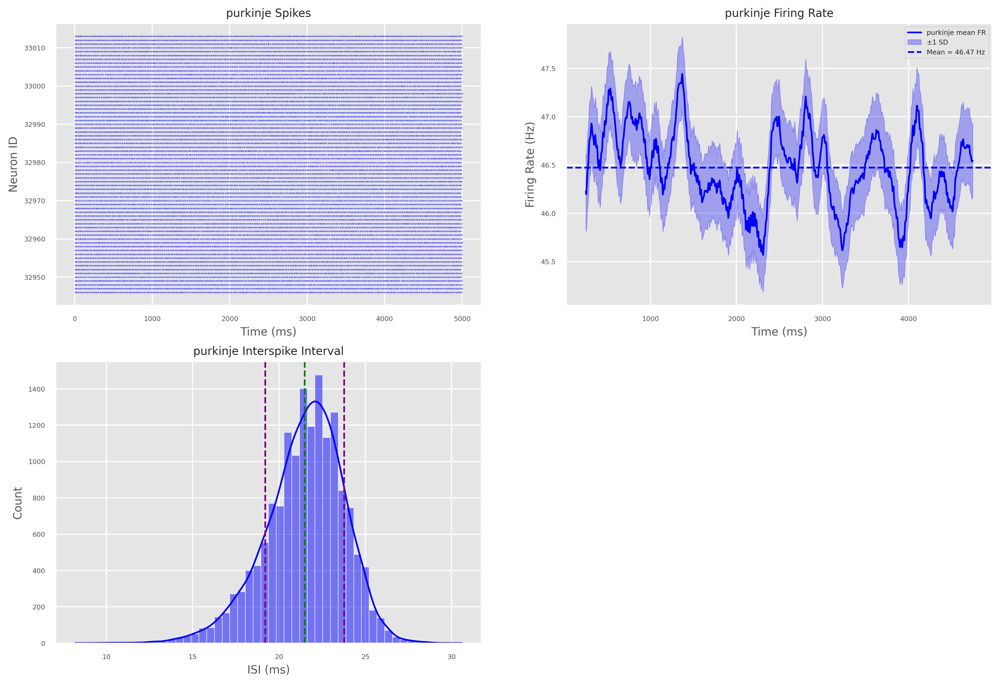

In [20]:
times_vectorPC, mean_ratePC, rates_per_neuronPC, stats_popPC, isi_dictPC, stats_dictPC = process_pop(df_spikes, "purkinje", color="blue", mask_flag=True, dt=5)

In [21]:
rates_per_neuronPC

array([[42.  , 42.  , 42.25, ..., 45.  , 45.25, 45.75],
       [46.5 , 46.5 , 46.75, ..., 45.  , 45.25, 45.25],
       [44.5 , 44.5 , 44.75, ..., 46.25, 45.75, 45.5 ],
       ...,
       [47.5 , 47.75, 47.75, ..., 45.75, 45.5 , 45.75],
       [46.5 , 46.75, 47.25, ..., 47.5 , 47.75, 47.75],
       [50.5 , 50.5 , 50.5 , ..., 46.25, 46.25, 45.75]])

Shape: (2342, 2)
[[  31.3   97. ]
 [  35.    41. ]
 [  48.6  113. ]
 ...
 [4957.5   71. ]
 [4959.4   79. ]
 [4973.3  103. ]]
Computing firing rates of mossy
Number of neurons: 117
Time vector: 0 4996.7
Number of bins: 1000
Kernel size: 40
Neuron ID: 1.0
First few spikes: [ 147.1  191.8  394.6  923.4 1771.7]
Neuron ID: 2.0
First few spikes: [150.6 612.7 745.2 754.4 993.4]
Neuron ID: 3.0
First few spikes: [  3.   11.9  15.7  33.6 144.2]
Rates array shape: (117, 1000)
Rates array first few values: [[ 0.   0.   0.  ...  0.   0.   0. ]
 [ 0.   0.   0.  ...  0.   0.   0. ]
 [33.5 35.  36.  ...  0.   0.   0. ]
 [ 0.   0.   0.  ...  0.   0.   0. ]
 [ 0.   0.   0.  ...  0.   0.   0. ]]
Rates array first few neurons: [[ 0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.  ]
 [33.5  35.   36.   36.5  36.  ]
 [ 0.    0.    0.    0.25  0.75]
 [ 0.    0.    0.    0.    0.  ]
 [ 0.75  1.25  1.75  2.25  2.75]
 [ 0.    0.    0.    0.    0.  ]
 [ 0.    0.    0.    0.    0.  ]
 [ 3.25  3.75  4.25

/tmp/ipykernel_2184/880894196.py:26: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


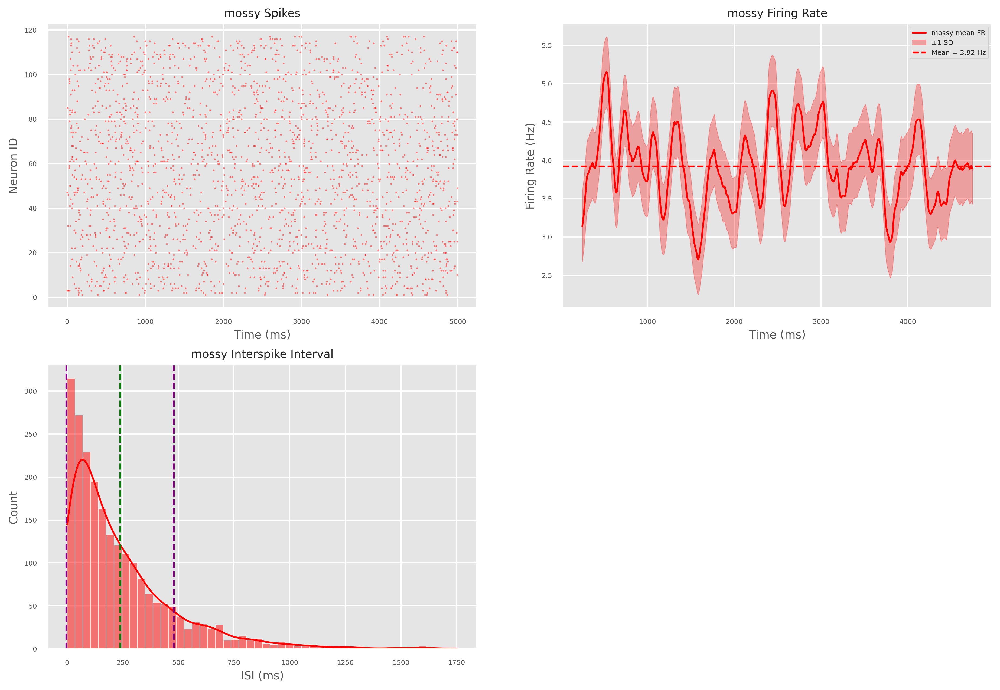

In [18]:
times_vectorMF, mean_rateMF, rates_per_neuronMF, stats_popMF, isi_disctMF, stats_dictMF = process_pop(df_spikes, "mossy", "red", mask_flag=True, dt=5)

# Standardized Temporal Covariance Matrix

In [22]:
rates_per_neuronPC

array([[42.  , 42.  , 42.25, ..., 45.  , 45.25, 45.75],
       [46.5 , 46.5 , 46.75, ..., 45.  , 45.25, 45.25],
       [44.5 , 44.5 , 44.75, ..., 46.25, 45.75, 45.5 ],
       ...,
       [47.5 , 47.75, 47.75, ..., 45.75, 45.5 , 45.75],
       [46.5 , 46.75, 47.25, ..., 47.5 , 47.75, 47.75],
       [50.5 , 50.5 , 50.5 , ..., 46.25, 46.25, 45.75]])

In [23]:
def compute_correlation_matrix(rates_array):
    """
    Standardize data (zero mean, unit std) per neuron, then compute covariance matrix between time bins.

    Args:
        rates_array: numpy array of shape (n_neurons, n_time_bins)

    Returns:
        cov_matrix: covariance matrix of shape (n_time_bins, n_time_bins)
    """
    # Center the data by subtracting mean firing rate per neuron (across time bins)
    centered_rates = rates_array - np.mean(rates_array, axis=1, keepdims=True)  # axis=1 for time bins

    # Number of neurons
    n_neurons = centered_rates.shape[0]

    # Compute covariance matrix between time bins: (n_time_bins x n_time_bins)
    # This is done by multiplying the transpose of centered_rates by centered_rates,
    # then normalizing by number of neurons
    cov_matrix = np.dot(centered_rates.T, centered_rates) / n_neurons

    # Compute standard deviations for each time bin (sqrt of diagonal)
    std_dev = np.sqrt(np.diag(cov_matrix))

    # Outer product of std deviations for normalization
    denom = np.outer(std_dev, std_dev)

    # Avoid division by zero
    denom[denom == 0] = 1e-10

    # Compute correlation matrix
    std_cov_matrix = cov_matrix / denom
    max_val = np.max(std_cov_matrix)
    min_val = np.min(std_cov_matrix)
    print(f"Max value of standardized covariance matrix: {max_val}")
    print(f"Min value of standardized covariance matrix: {min_val}")

    return std_cov_matrix


In [24]:
temporal_covariancePC = compute_correlation_matrix(rates_per_neuronPC)

Max value of standardized covariance matrix: 1.0000000000000002
Min value of standardized covariance matrix: -0.4918944824269291


In [25]:
temporal_covariancePC

array([[1.        , 0.99104479, 0.97093513, ..., 0.09791333, 0.11014187,
        0.10566836],
       [0.99104479, 1.        , 0.98950269, ..., 0.08211741, 0.09593544,
        0.09495983],
       [0.97093513, 0.98950269, 1.        , ..., 0.08319193, 0.09881323,
        0.10138819],
       ...,
       [0.09791333, 0.08211741, 0.08319193, ..., 1.        , 0.98733894,
        0.95945772],
       [0.11014187, 0.09593544, 0.09881323, ..., 0.98733894, 1.        ,
        0.98406911],
       [0.10566836, 0.09495983, 0.10138819, ..., 0.95945772, 0.98406911,
        1.        ]])

In [23]:
temporal_covariancePC.shape

(900, 900)

In [26]:
def plot_temporal_covariance(cov_matrix, ax, title, time_vector, xlabel="Time (ms)", 
                            ylabel="Time (ms)", save_path=None):
    """
    Plot the temporal covariance matrix.
    """
    max_abs_val = np.max(np.abs(cov_matrix))
    title = f"Standardized Temporal Covariance Matrix: {title}"
    sns.heatmap(cov_matrix, cmap='bwr', ax=ax, 
                cbar=True, vmin=-max_abs_val, vmax=max_abs_val, center=0)
    ax.set_title(title)
    tick_positions = np.arange(0, cov_matrix.shape[0], 50)
    tick_labels = time_vector[::50]
    ax.set_xticks(tick_positions, tick_labels.astype(int), rotation=45)
    ax.set_yticks(tick_positions, tick_labels.astype(int))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    
    if save_path:
        plt.savefig(save_path)

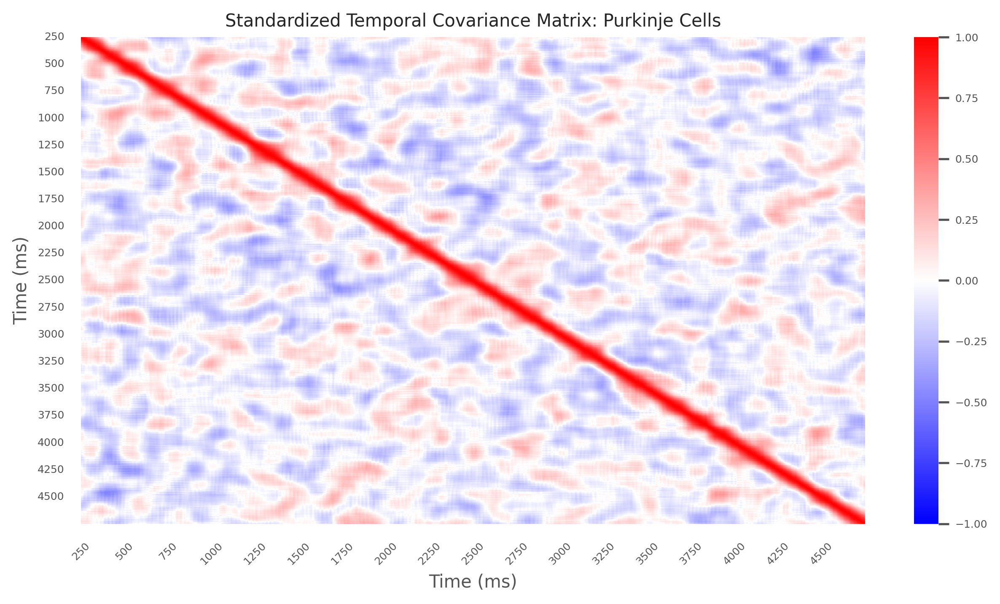

In [27]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=300)

plot_temporal_covariance(temporal_covariancePC, axs, "Purkinje Cells",times_vectorPC, xlabel="Time (ms)", ylabel="Time (ms)", save_path=None)

In [26]:
shape = (3,3)
test = np.random.rand(*shape)
for i in range(shape[0]): # i = 1
    for j in range(i, shape[1]):
        print(f"Element ({i}, {j}): {test[i, j]}")

Element (0, 0): 0.5266523335399589
Element (0, 1): 0.9135368637587351
Element (0, 2): 0.2432983685565966
Element (1, 1): 0.8367674137074909
Element (1, 2): 0.8611571531960728
Element (2, 2): 0.564224626525577


In [28]:
def compute_pvalue(neurons_rates, cov_matrix):
    n_neurons = neurons_rates.shape[0]
    n_time_bins = neurons_rates.shape[1]

    p_values = np.zeros((n_time_bins, n_time_bins))
    for i in range(n_time_bins):
        for j in range(i, n_time_bins):
            if i == j:
                p_values[i, j] = 1.0
            else:
                r = cov_matrix[i, j]
                t_stat = r * np.sqrt((n_neurons - 2) / (1 - r**2))
                p_value = 2 * (1 - stats.t.cdf(np.abs(t_stat), df=n_neurons - 2))
                p_values[i, j] = p_value
                p_values[j, i] = p_value
    return p_values
p_valuesPC = compute_pvalue(rates_per_neuronPC, temporal_covariancePC)
p_valuesPC

array([[1.        , 0.        , 0.        , ..., 0.4269882 , 0.37124764,
        0.39110606],
       [0.        , 1.        , 0.        , ..., 0.50558447, 0.43643081,
        0.44113143],
       [0.        , 0.        , 1.        , ..., 0.50001247, 0.42273079,
        0.4106838 ],
       ...,
       [0.4269882 , 0.50558447, 0.50001247, ..., 1.        , 0.        ,
        0.        ],
       [0.37124764, 0.43643081, 0.42273079, ..., 0.        , 1.        ,
        0.        ],
       [0.39110606, 0.44113143, 0.4106838 , ..., 0.        , 0.        ,
        1.        ]])

Min p-value: 0.0, Max p-value: 1.0
Significant p-values (alpha=0.05): 80426 out of 810000


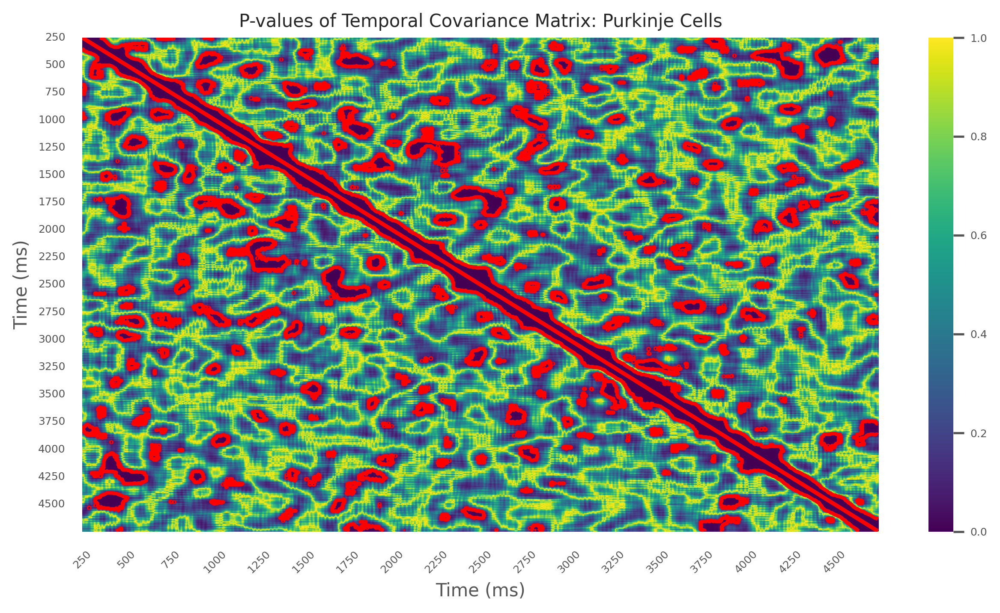

In [29]:
def plot_pvalues(p_values, ax, title, time_vector, alpha, save_path=None):
    min_val = np.min(p_values)
    max_val = np.max(p_values)
    print(f"Min p-value: {min_val}, Max p-value: {max_val}")
    title = f"P-values of Temporal Covariance Matrix: {title}"
    
    sig_mask = p_values < alpha
    print(f"Significant p-values (alpha={alpha}): {np.sum(sig_mask)} out of {p_values.size}")

    sns.heatmap(p_values, cmap='viridis', ax=ax, 
                cbar=True, vmin=min_val, vmax=max_val, center=0.5)
    ax.contour(sig_mask.astype(int), levels=[0.5], colors='red', linewidths=2)
    ax.set_title(title)
    tick_values = time_vector[::50]
    tick_positions = np.arange(0, p_values.shape[0], 50)
    ax.set_xticks(tick_positions, tick_values.astype(int), rotation=45)
    ax.set_yticks(tick_positions, tick_values.astype(int))
    ax.set_xlabel("Time (ms)")
    ax.set_ylabel("Time (ms)")
    if save_path:
        plt.savefig(save_path)
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=300)
plot_pvalues(p_valuesPC, axs, "Purkinje Cells", times_vectorPC, alpha=0.05, save_path=None)
    

    

In [30]:
def find_significant_regions(cov_matrix, p_values, time_vector, alpha=0.05):
    """
    Find regions of significant correlations in the covariance matrix.
    """
    sig_mask = p_values < alpha
    regions = []
    signicant_bins = []

    range_bins = min(20, p_values.shape[0])
    for bin in range(range_bins):
        bin_true = np.any(sig_mask[bin, :]), np.any(sig_mask[:, bin])
        

find_significant_regions(temporal_covariancePC, p_valuesPC, times_vectorPC, alpha=0.05)

In [31]:
def find_significant_regions(cov_matrix, p_values, time_vector, alpha=0.05, min_region_size=3):
    """
    Find regions of significant correlations in the covariance matrix.
    """
    sig_mask = p_values < alpha
    regions = []
    
    for bin in range(1, min(50, cov_matrix.shape[0])):
        # bin = 1 means b1-> b2, b2 -> b3, etc.
        print(f"Checking bin {bin}...")
        # bin = 5 we are looking at correlations 10 bins apart
        diagonal_sig = []
        diagonal_corr = []
        diagonal_pvals = []
        for i in range(cov_matrix.shape[0] - bin):
            j = i + bin # position ahead of i

            diagonal_sig.append(sig_mask[i, j])
            diagonal_corr.append(cov_matrix[i, j])
            diagonal_pvals.append(p_values[i, j])
        diagonal_sig = np.array(diagonal_sig)
        diagonal_corr = np.array(diagonal_corr)
        diagonal_pvals = np.array(diagonal_pvals)

    # If cov_matrix is 5x5, for bin=1:
    # i=0, j=1 → correlation between time bin 0 and 1
    # i=1, j=2 → correlation between time bin 1 and 2  
    # i=2, j=3 → correlation between time bin 2 and 3
    # i=3, j=4 → correlation between time bin 3 and 4

    # Step 4: Find consecutive runs of significant correlations
        consecutive_runs = find_consecutive_runs(diagonal_sig, min_region_size)
    # This returns [(start_idx, end_idx), (start_idx, end_idx), ...]
    # For example: [(2, 6), (10, 14)] means two regions found
    
    # Step 5: For each consecutive run, create a region entry
        for start_idx, end_idx in consecutive_runs:
            region_length = end_idx - start_idx + 1
            
            # Extract the correlation values for this specific region
            region_correlations = diagonal_corr[start_idx:end_idx+1]
            region_pvals = diagonal_pvals[start_idx:end_idx+1]
            
            region = {
                'type': 'diagonal',
                'lag_bins': bin,                                                
                'lag_time_ms': bin * (time_vector[1] - time_vector[0]),       
                'start_bin': start_idx,                                        
                'end_bin': end_idx,                                           
                'region_length': region_length,                               
                'start_time': time_vector[start_idx],                         
                'end_time': time_vector[end_idx],                            
                'mean_correlation': np.mean(region_correlations),             
                'std_correlation': np.std(region_correlations),              
                'mean_p_value': np.mean(region_pvals),                       
                'min_p_value': np.min(region_pvals),                         
                'bin_pairs': [(i, i + bin) for i in range(start_idx, end_idx + 1)]  
            }
            regions.append(region)

    return regions

def find_consecutive_runs(sig_mask, min_region_size=4):
    """
    Find consecutive True values in a boolean array.
    
    Example:
    boolean_array = [False, True, True, True, False, False, True, True, False]
    This should find: [(1, 3), (6, 7)] if min_length = 2
    """

    # Step A: Add padding to make edge detection easier
    # [F, T, T, T, F, F, T, T, F] becomes [F, F, T, T, T, F, F, T, T, F, F]
    padded = np.concatenate(([False], sig_mask, [False]))
    
    # Step B: Find transitions by looking at differences
    # [F, F, T, T, T, F, F, T, T, F, F] → [0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0]
    diff = np.diff(padded.astype(int))
    # diff = [0, 1, 0, 0, -1, 0, 1, 0, -1, 0]
    
    # Step C: Find start and end positions
    starts = np.where(diff == 1)[0]  # Where it goes from 0→1 (False→True)
    ends = np.where(diff == -1)[0] - 1  # Where it goes from 1→0 (True→False)
    
    # Step D: Filter by minimum length
    valid_runs = [(start, end) for start, end in zip(starts, ends) 
                  if (end - start + 1) >= min_region_size]
    
    return valid_runs


In [32]:
regions_significantPC = find_significant_regions(temporal_covariancePC, p_valuesPC, times_vectorPC, alpha=0.05, min_region_size=4)

Checking bin 1...
Checking bin 2...
Checking bin 3...
Checking bin 4...
Checking bin 5...
Checking bin 6...
Checking bin 7...
Checking bin 8...
Checking bin 9...
Checking bin 10...
Checking bin 11...
Checking bin 12...
Checking bin 13...
Checking bin 14...
Checking bin 15...
Checking bin 16...
Checking bin 17...
Checking bin 18...
Checking bin 19...
Checking bin 20...
Checking bin 21...
Checking bin 22...
Checking bin 23...
Checking bin 24...
Checking bin 25...
Checking bin 26...
Checking bin 27...
Checking bin 28...
Checking bin 29...
Checking bin 30...
Checking bin 31...
Checking bin 32...
Checking bin 33...
Checking bin 34...
Checking bin 35...
Checking bin 36...
Checking bin 37...
Checking bin 38...
Checking bin 39...
Checking bin 40...
Checking bin 41...
Checking bin 42...
Checking bin 43...
Checking bin 44...
Checking bin 45...
Checking bin 46...
Checking bin 47...
Checking bin 48...
Checking bin 49...


In [33]:
def analyze_regions_summary(regions):
    positive_regions = []
    negative_regions = []

    for i, region in enumerate(regions):
        if region['mean_correlation'] > 0 and region['mean_correlation'] < 0.6:
            positive_regions.append(region)
        else:
            negative_regions.append(region)

    print(f"Positive correlation regions: {len(positive_regions)}")
    print(f"Negative correlation regions: {len(negative_regions)}")
    return positive_regions, negative_regions
positive_regionsPC, negative_regionsPC = analyze_regions_summary(regions_significantPC)

Positive correlation regions: 258
Negative correlation regions: 49


In [34]:
def select_regions(positive_regions, negative_regions):
    best_positive = None
    best_negative = None
    if positive_regions:
        positive_sorted = sorted(positive_regions, key=lambda x: x['mean_correlation'], reverse=True)
        best_positive = positive_sorted[10]
        print(f"\nBEST POSITIVE REGION:")
        print(f"  Correlation: {best_positive['mean_correlation']:.3f}")
        print(f"  Lag: {best_positive['lag_bins']} bins ({best_positive['lag_time_ms']:.1f} ms)")
        print(f"  Time: {best_positive['start_time']:.1f} - {best_positive['end_time']:.1f} ms")
        print(f"  Bin pairs: {best_positive['bin_pairs'][:3]}...")
    
    if negative_regions:
        negative_sorted = sorted(negative_regions, key=lambda x: x['mean_correlation'])
        best_negative = negative_sorted[0]
        print(f"\nBEST NEGATIVE REGION:")
        print(f"  Correlation: {best_negative['mean_correlation']:.3f}")
        print(f"  Lag: {best_negative['lag_bins']} bins ({best_negative['lag_time_ms']:.1f} ms)")
        print(f"  Time: {best_negative['start_time']:.1f} - {best_negative['end_time']:.1f} ms")
        print(f"  Bin pairs: {best_negative['bin_pairs'][:3]}...")
    
    return best_positive, best_negative
best_positivePC, best_negativePC = select_regions(positive_regionsPC, negative_regionsPC)



BEST POSITIVE REGION:
  Correlation: 0.441
  Lag: 15 bins (75.0 ms)
  Time: 4415.0 - 4670.0 ms
  Bin pairs: [(833, 848), (834, 849), (835, 850)]...

BEST NEGATIVE REGION:
  Correlation: -0.319
  Lag: 46 bins (230.0 ms)
  Time: 3200.0 - 3270.0 ms
  Bin pairs: [(590, 636), (591, 637), (592, 638)]...


## Understanding Time Bins and Lags

When we say **"lag of 2"**, we're looking at correlations between:
- **Bin 0** and **Bin 2** (0+2)
- **Bin 1** and **Bin 3** (1+2) 
- **Bin 2** and **Bin 4** (2+2)
- etc.

So it's **NOT** the matrix position `(0,2)`, but rather the **temporal relationship** between time bins that are 2 steps apart.

## Visual Example

Let's say you have a 5×5 correlation matrix representing 5 time bins:

```
Time bins: [0, 1, 2, 3, 4]
Matrix positions:
     0   1   2   3   4
0 [ 1.0 0.3 0.1 0.2 0.0]
1 [ 0.3 1.0 0.4 0.1 0.1]
2 [ 0.1 0.4 1.0 0.5 0.2]
3 [ 0.2 0.1 0.5 1.0 0.3]
4 [ 0.0 0.1 0.2 0.3 1.0]
```

**For lag = 2:**
- We extract the diagonal at offset 2: positions (0,2), (1,3), (2,4)
- These values are: [0.1, 0.1, 0.2]
- This tells us: "How correlated is activity at time t with activity at time t+2?"

## Key Point

**The lag is a TEMPORAL offset, not a matrix coordinate offset.** 

- **Lag = 2** means "2 time steps later"
- If your time bins are 5ms apart, lag=2 means 10ms later
- If your time bins are 1ms apart, lag=2 means 2ms later

So when you see `bin_pairs = [(0, 11), (1, 12), (2, 13)]` with lag=11:
- You're comparing neural activity at time bin 0 with activity at time bin 11
- Time bin 0 might be at 250ms, time bin 11 might be at 305ms (if dt=5ms)
- This asks: "Does activity at 250ms predict activity at 305ms?"

Does this clarify the concept for you?

In [35]:
# In your case with your function:
def plot_neural_activity_for_region(region, rates_array, time_vector, pop, color, n_neurons_to_plot=8):
    # our analysis with respect to pair of bins shifted by a lag which is = 20
    # so if first bin is 0, second bin is 20
    # so we have two different periods of activity
    bin_pairs = region['bin_pairs']  # Example: [(0, 11), (1, 12), (2, 13), ...]
    lag = region['lag_bins']         # Example: 11
    
    time_bins_1 = [pair[0] for pair in bin_pairs]  # [0, 1, 2, ...] - Earlier times
    time_bins_2 = [pair[1] for pair in bin_pairs]  # [11, 12, 13, ...] - Later times
    
    print(f"Lag = {lag}")
    print(f"We're comparing:")
    for i in range(min(5, len(bin_pairs))):  # Show first 5 pairs
        t1_ms = time_vector[bin_pairs[i][0]]
        t2_ms = time_vector[bin_pairs[i][1]]
        print(f"  Time bin {bin_pairs[i][0]} ({t1_ms:.1f}ms) vs Time bin {bin_pairs[i][1]} ({t2_ms:.1f}ms)")
    
    # Extract neural activity for these time periods
    activity_period_1 = rates_array[:, time_bins_1]  # Activity at earlier times
    activity_period_2 = rates_array[:, time_bins_2]  # Activity at later times (lag offset)
    print(f"Activity shape for period 1: {activity_period_1.shape}")
    print(f"Activity shape for period 2: {activity_period_2.shape}")

    neuron_variability = np.std(rates_array, axis=1)  # Variability across time bins for each neuron
    print(f"Neuron variability shape: {neuron_variability.shape}")
    # Sort neurons by variability
    sorted_neurons = np.argsort(neuron_variability)[-n_neurons_to_plot:] 
    print(f"Most variable neurons: {sorted_neurons}")
    print(f"Their variabilities: {neuron_variability[sorted_neurons]}")

    fig, axs = plt.subplots(2, 2, figsize=(12, 8), dpi=300)
    # time bins to actual times
    time1 = time_vector[time_bins_1]
    time2 = time_vector[time_bins_2]

    print(time1[:5], time2[:5])
    axs1 = axs[0, 0]
    axs2 = axs[0, 1]
    axs1.set_title(f"Neural Activity at Time Bins)")
    axs2.set_title(f"Neural Activity at Time Bins)")
    for neuron_idx in sorted_neurons:
        axs1.plot(time1, activity_period_1[neuron_idx], label=f'Neuron {neuron_idx}', alpha=0.5)
        axs2.plot(time2, activity_period_2[neuron_idx], label=f'Neuron {neuron_idx}', alpha=0.5)
    axs1.set_xlabel("Time (ms)")
    axs1.set_ylabel("Firing Rate (Hz)")
    axs2.set_xlabel("Time (ms)")
    axs2.set_ylabel("Firing Rate (Hz)")
    axs1.legend(loc='upper right', fontsize='small')
    axs2.legend(loc='upper right', fontsize='small')

    # scatter plot of average activity
    average_activity_1 = np.mean(activity_period_1, axis=1)
    average_activity_2 = np.mean(activity_period_2, axis=1)
    axs3 = axs[1, 0]
    axs3.set_title(f"Average Activity at Time Bins)")
    axs3.scatter(average_activity_1, average_activity_2, alpha=0.5, color=color, s=30)
    axs3.scatter(average_activity_1[sorted_neurons], average_activity_2[sorted_neurons], alpha=0.8, color=color, s=50)
    axs3.set_xlabel("Average Activity at Earlier Times (Period One) (Hz)")
    axs3.set_ylabel("Average Activity at Later Times (Period Two) (Hz)")

    correlation = np.corrcoef(average_activity_1, average_activity_2)[0, 1]
    min_val = min(np.min(average_activity_1), np.min(average_activity_2))
    max_val = max(np.max(average_activity_1), np.max(average_activity_2))
    if region['mean_correlation'] > 0:
        axs3.plot([min_val, max_val], [min_val, max_val], color=color, linestyle='--', label='y=x')
    else:
        axs3.plot([min_val, max_val], [max_val, min_val], color=color, linestyle='--', label='y=-x')
    axs3.set_title(f'Cross-Period Correlation\nr = {correlation:.3f}')

    axs4 = axs[1, 1]
    axs4.set_title('Distribution of Activity Changes')
    axs4.set_xlabel('Activity Change (Period 2 - Period 1) Hz')
    axs4.set_ylabel('Number of Neurons')
    activity_change = average_activity_2 - average_activity_1
    sns.histplot(activity_change, bins=30, kde=True, ax=axs4, color=color, alpha=0.5)
    axs4.axvline(0, color=color, linestyle='--', label='No Change')

    axis = axs.flatten()
    for ax in axis:
        ax.grid(True, alpha=0.3)
    fig.suptitle(f"Neural Activity Analysis for {pop} - Region: {region['start_time']:.1f} to {region['end_time']:.1f} ms\n"
                 f"Mean Correlation: {region['mean_correlation']:.3f}, Lag: {region['lag_bins']} bins ({region['lag_time_ms']:.1f} ms)",
                 fontsize=14)
    plt.tight_layout()
    plt.show()

Lag = 15
We're comparing:
  Time bin 833 (4415.0ms) vs Time bin 848 (4490.0ms)
  Time bin 834 (4420.0ms) vs Time bin 849 (4495.0ms)
  Time bin 835 (4425.0ms) vs Time bin 850 (4500.0ms)
  Time bin 836 (4430.0ms) vs Time bin 851 (4505.0ms)
  Time bin 837 (4435.0ms) vs Time bin 852 (4510.0ms)
Activity shape for period 1: (68, 52)
Activity shape for period 2: (68, 52)
Neuron variability shape: (68,)
Most variable neurons: [14 35 37  5  1 40  6 16]
Their variabilities: [2.57481084 2.57834158 2.58375891 2.609504   2.6111634  2.61256725
 2.64624099 2.66498332]
[4415. 4420. 4425. 4430. 4435.] [4490. 4495. 4500. 4505. 4510.]


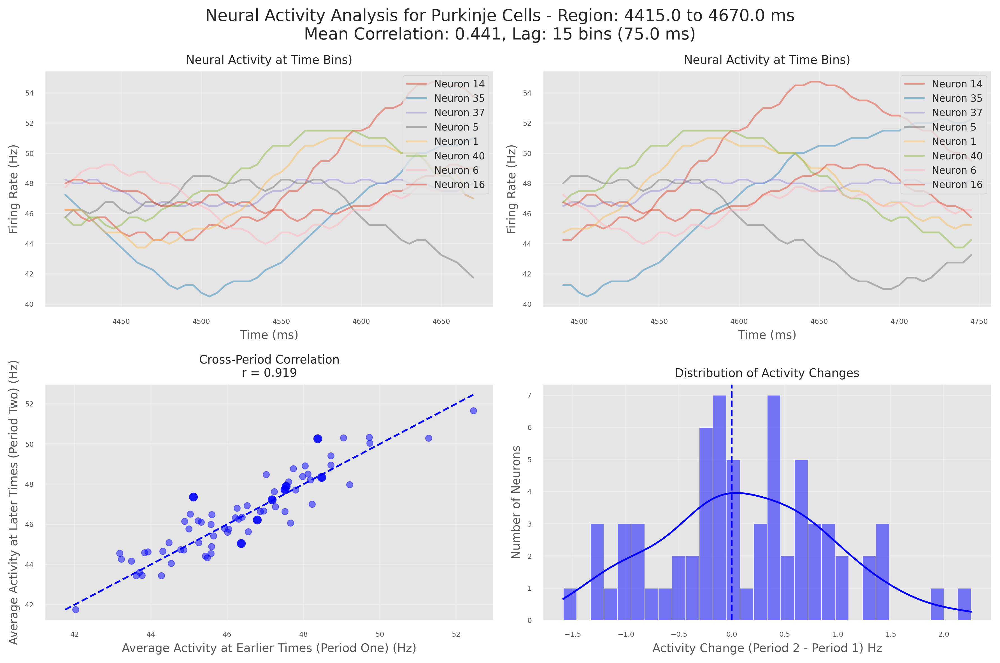

In [36]:
plot_neural_activity_for_region(best_positivePC, rates_per_neuronPC, times_vectorPC, "Purkinje Cells", 'blue', n_neurons_to_plot=8)

Lag = 46
We're comparing:
  Time bin 590 (3200.0ms) vs Time bin 636 (3430.0ms)
  Time bin 591 (3205.0ms) vs Time bin 637 (3435.0ms)
  Time bin 592 (3210.0ms) vs Time bin 638 (3440.0ms)
  Time bin 593 (3215.0ms) vs Time bin 639 (3445.0ms)
  Time bin 594 (3220.0ms) vs Time bin 640 (3450.0ms)
Activity shape for period 1: (68, 15)
Activity shape for period 2: (68, 15)
Neuron variability shape: (68,)
Most variable neurons: [14 35 37  5  1 40  6 16]
Their variabilities: [2.57481084 2.57834158 2.58375891 2.609504   2.6111634  2.61256725
 2.64624099 2.66498332]
[3200. 3205. 3210. 3215. 3220.] [3430. 3435. 3440. 3445. 3450.]


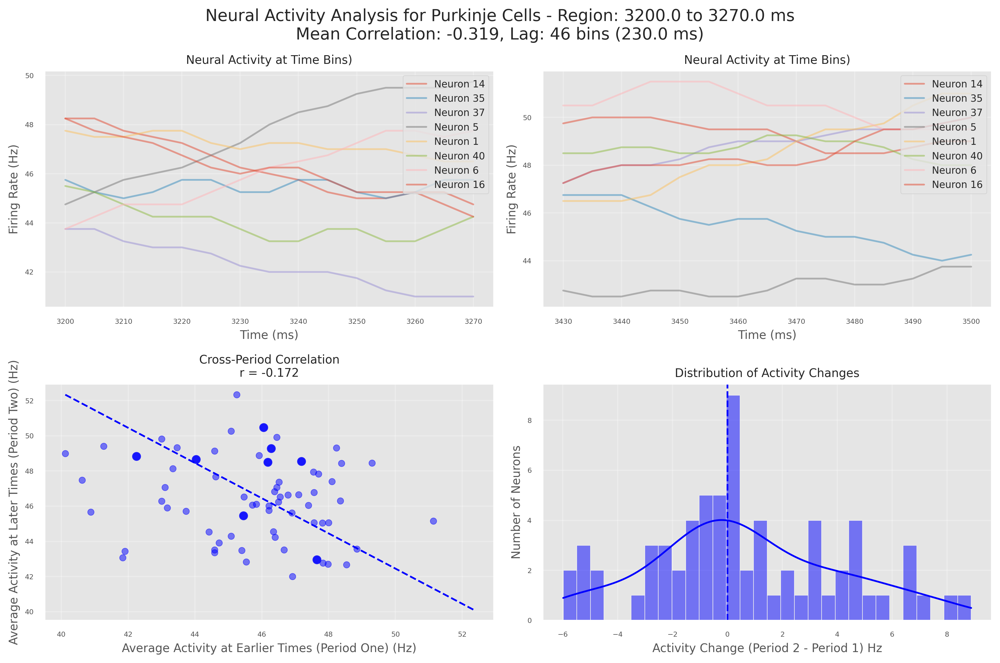

In [37]:
plot_neural_activity_for_region(best_negativePC, rates_per_neuronPC, times_vectorPC, "Purkinje Cells", 'blue', n_neurons_to_plot=8)

In [37]:
test = np.random.rand(10)
print(test)
sorted_ = np.argsort(test) # Get indices of 8 most variable neurons
sorted_

[0.97456029 0.2373787  0.1544781  0.72857433 0.96665612 0.79904768
 0.56634314 0.54171445 0.24349529 0.71645405]


array([2, 1, 8, 7, 6, 9, 3, 5, 4, 0])

In [38]:
regions_significantPC

[{'type': 'diagonal',
  'lag_bins': 1,
  'lag_time_ms': np.float64(5.0),
  'start_bin': np.int64(0),
  'end_bin': np.int64(898),
  'region_length': np.int64(899),
  'start_time': np.float64(250.0),
  'end_time': np.float64(4740.0),
  'mean_correlation': np.float64(0.989450667911345),
  'std_correlation': np.float64(0.002682982838822998),
  'mean_p_value': np.float64(0.0),
  'min_p_value': np.float64(0.0),
  'bin_pairs': [(0, 1),
   (1, 2),
   (2, 3),
   (3, 4),
   (4, 5),
   (5, 6),
   (6, 7),
   (7, 8),
   (8, 9),
   (9, 10),
   (10, 11),
   (11, 12),
   (12, 13),
   (13, 14),
   (14, 15),
   (15, 16),
   (16, 17),
   (17, 18),
   (18, 19),
   (19, 20),
   (20, 21),
   (21, 22),
   (22, 23),
   (23, 24),
   (24, 25),
   (25, 26),
   (26, 27),
   (27, 28),
   (28, 29),
   (29, 30),
   (30, 31),
   (31, 32),
   (32, 33),
   (33, 34),
   (34, 35),
   (35, 36),
   (36, 37),
   (37, 38),
   (38, 39),
   (39, 40),
   (40, 41),
   (41, 42),
   (42, 43),
   (43, 44),
   (44, 45),
   (45, 46),

In [39]:
rates_per_neuronPC.shape

(68, 900)

In [40]:
rates_per_neuronMF

array([[ 4.25,  3.75,  3.25, ...,  0.  ,  0.  ,  0.  ],
       [ 0.25,  0.  ,  0.  , ...,  0.  ,  0.  ,  0.  ],
       [ 7.5 ,  7.5 ,  7.5 , ...,  8.75,  8.25,  7.75],
       ...,
       [ 0.  ,  0.  ,  0.  , ...,  3.75,  4.25,  4.75],
       [ 8.  ,  9.  , 10.  , ...,  0.  ,  0.  ,  0.  ],
       [ 0.  ,  0.  ,  0.  , ...,  0.  ,  0.  ,  0.  ]])

In [41]:
def extract_upper_triangle(matrix):
    """
    Extract the upper triangle of a square matrix.
    """
    return matrix[np.triu_indices_from(matrix, k=1)]

temporal_corr_PCr = extract_upper_triangle(temporal_covariancePC)
print("Shape of upper triangle of temporal covariance matrix for Purkinje cells:", temporal_corr_PCr.shape)


Shape of upper triangle of temporal covariance matrix for Purkinje cells: (404550,)


Max value of standardized covariance matrix: 1.0000000000000002
Min value of standardized covariance matrix: -0.3082365615939087


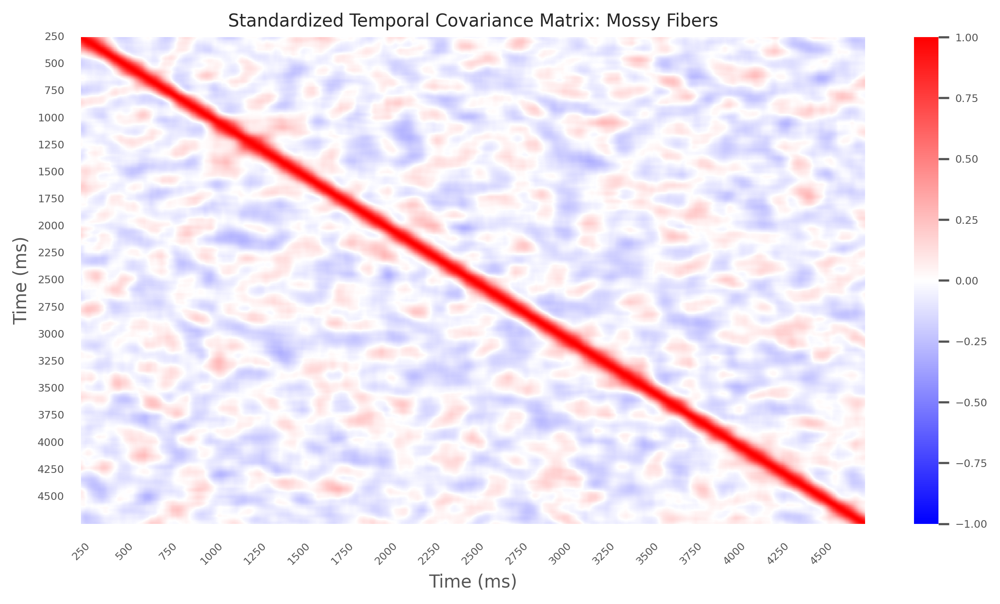

In [42]:
temporal_covarianceMF= compute_standardized_covariance(rates_per_neuronMF)
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=300)
plot_temporal_covariance(temporal_covarianceMF, axs, "Mossy Fibers",times_vectorMF, xlabel="Time (ms)", ylabel="Time (ms)", save_path=None)

In [38]:
def autocorr_profile(cov_matrix, max_lag=100):
    """
    Extract autocorrelation profile from covariance matrix along diagonals
    Args:
        cov_matrix: 2D numpy array (n_time_bins x n_time_bins)
        max_lag: maximum lag (number of diagonals) to consider
    Returns:
        lags: array of lag values (0 to max_lag)
        autocorr: autocorrelation values at each lag
    """
    n = cov_matrix.shape[0]
    lags = np.arange(max_lag + 1)
    autocorr = np.array([np.mean(np.diagonal(cov_matrix, offset=lag)) for lag in lags])
    return lags, autocorr

def decay_width(lags, autocorr, threshold=np.exp(-1)):
    """
    Find lag where autocorrelation falls below threshold.

    Returns lag value or max lag if threshold not crossed.
    """
    below_thresh = np.where(autocorr < threshold)[0]
    if len(below_thresh) == 0:
        return lags[-1]
    else:
        return lags[below_thresh[0]]



In [40]:
# lags_mf, ac_mf = autocorr_profile(temporal_covarianceMF, max_lag=200)
lags_pc, ac_pc = autocorr_profile(temporal_covariancePC, max_lag=200)

# width_mf = decay_width(lags_mf, ac_mf)
width_pc = decay_width(lags_pc, ac_pc)

# print(f"Mossy fibers autocorr decay width: {width_mf} bins")
print(f"Purkinje cells autocorr decay width: {width_pc} bins")


Purkinje cells autocorr decay width: 18 bins


In [41]:
# Plot autocorrelation profiles together
plt.figure(figsize=(10, 6))
plt.plot(lags_mf, ac_mf, 'r-', label='Mossy Fibers')
plt.plot(lags_pc, ac_pc, 'b-', label='Purkinje Cells')
plt.axhline(y=np.exp(-1), color='gray', linestyle='--', label='1/e threshold')
plt.axvline(x=width_mf, color='r', linestyle=':', label=f'Decay width ({width_mf} bins)')
plt.xlabel('Lag (bins)')
plt.ylabel('Autocorrelation')
plt.title('Temporal Autocorrelation Profiles')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

NameError: name 'lags_mf' is not defined

<Figure size 2000x1200 with 0 Axes>

In [46]:
def off_diagonal_stats(cov_matrix):
    """
    Compute mean and variance of off-diagonal elements.
    Args:
        cov_matrix: 2D numpy array (square)
    Returns:
        mean_offdiag: mean of off-diagonal elements
        var_offdiag: variance of off-diagonal elements
    """
    n = cov_matrix.shape[0]
    mask = ~np.eye(n, dtype=bool) # remove diagonal
    off_diag_vals = cov_matrix[mask]
    mean_offdiag = np.mean(off_diag_vals)
    var_offdiag = np.var(off_diag_vals)
    return mean_offdiag, var_offdiag

mean_off_mf, var_off_mf = off_diagonal_stats(temporal_covarianceMF)
mean_off_pc, var_off_pc = off_diagonal_stats(temporal_covariancePC)

print(f"Mossy fibers off-diagonal mean: {mean_off_mf:.4f}, variance: {var_off_mf:.4f}")
print(f"Purkinje cells off-diagonal mean: {mean_off_pc:.4f}, variance: {var_off_pc:.4f}")


Mossy fibers off-diagonal mean: -0.0010, variance: 0.0311
Purkinje cells off-diagonal mean: -0.0010, variance: 0.0377


In [42]:
def perform_pca(corr_matrix, n_components=None):
    """
    Perform PCA on corellation matrix.

    Args:
        cov_matrix: 2D numpy array (square)
        n_components: number of principal components to extract

    Returns:
        pca: fitted PCA object
        components: principal components (eigenvectors)
        explained_variance: explained variance ratios
    """
    if n_components is None:
        pca = PCA()
    else:
        pca = PCA(n_components=n_components)
    components = pca.fit_transform(corr_matrix)
    explained_variance_ratio = pca.explained_variance_ratio_
    eigenvalues = pca.explained_variance_
    return pca, components, explained_variance_ratio, eigenvalues

# pca_mf, comps_mf, var_mf, eigen_val_mf = perform_pca(temporal_covarianceMF, 500)
pca_pc, comps_pc, var_pc, eigen_val_pc = perform_pca(temporal_covariancePC, 500)

# print("Mossy fibers explained variance ratios:", var_mf[:3])
print("Purkinje cells explained variance ratios:", var_pc[:3])
# print("Mossy fibers total variance:", np.sum(eigen_val_mf))
print("Purkinje cells total variance:", np.sum(eigen_val_pc))


Purkinje cells explained variance ratios: [0.14418892 0.12566759 0.10828671]
Purkinje cells total variance: 34.89174763621651


In [48]:
comps_mf.shape, comps_pc.shape

((900, 500), (900, 500))

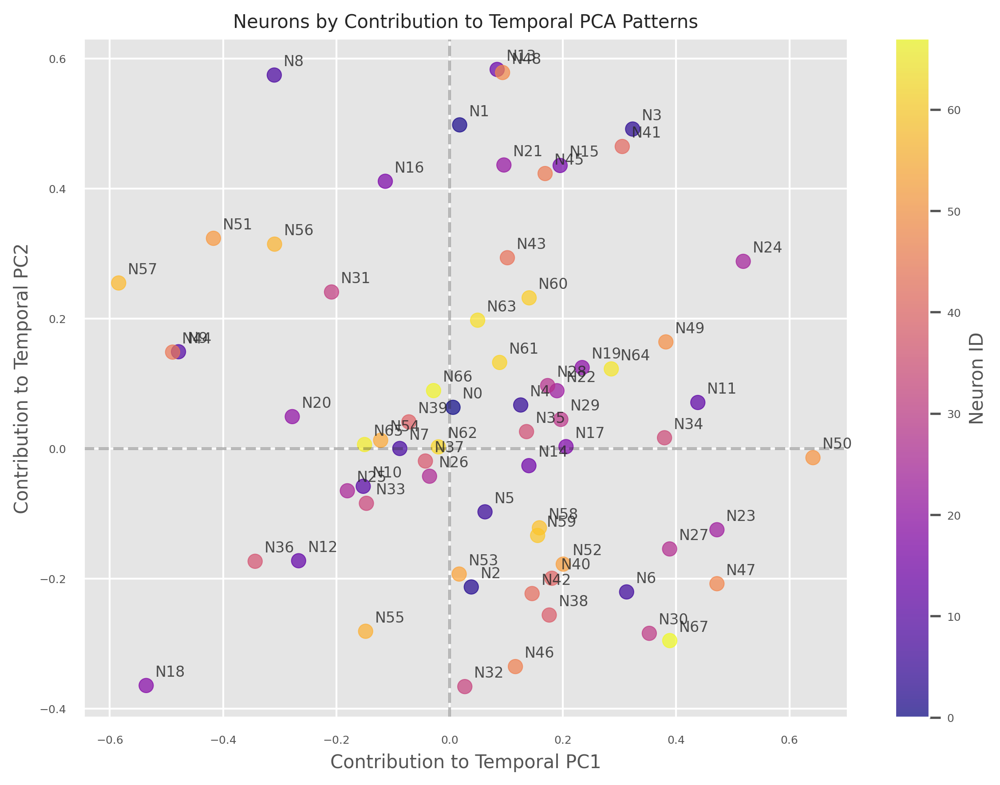

In [43]:
def project_neurons_using_temporal_pca(rates_neurons, temporal_pca, temporal_components):
    """
    Project neurons based on how much they contribute to temporal patterns
    """
    n_neurons, n_time_bins = rates_neurons.shape

    z_scored_neurons = (rates_neurons - np.mean(rates_neurons, axis=1, keepdims=True)) / np.std(rates_neurons, axis=1, keepdims=True)
    
    # Compute how much each neuron contributes to each temporal PC
    neuron_contributions = np.zeros((n_neurons, temporal_components.shape[1]))
    
    for neuron_idx in range(n_neurons):
        neuron_activity = rates_neurons[neuron_idx, :]
        
        # Project neuron activity onto each temporal PC
        for pc_idx in range(temporal_components.shape[1]):
            temporal_pattern = temporal_components[:, pc_idx]
            
            # Compute correlation between neuron activity and temporal pattern
            if len(neuron_activity) == len(temporal_pattern):
                contribution = np.corrcoef(neuron_activity, temporal_pattern)[0, 1]
                neuron_contributions[neuron_idx, pc_idx] = contribution if not np.isnan(contribution) else 0
    
    # Plot neurons based on their contributions to temporal patterns
    fig, ax = plt.subplots(1, 1, figsize=(8, 6), dpi=300)
    scatter = ax.scatter(neuron_contributions[:, 0], neuron_contributions[:, 1], 
                        alpha=0.7, s=60, c=range(n_neurons), cmap='plasma')
    
    # Add neuron labels
    for i, (x, y) in enumerate(neuron_contributions[:, :2]):
        ax.annotate(f'N{i}', (x, y), xytext=(5, 5), textcoords='offset points', 
                   fontsize=8, alpha=0.8)
    
    ax.set_title('Neurons by Contribution to Temporal PCA Patterns')
    ax.set_xlabel('Contribution to Temporal PC1')
    ax.set_ylabel('Contribution to Temporal PC2')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax.axvline(x=0, color='k', linestyle='--', alpha=0.3)
    plt.colorbar(scatter, label='Neuron ID')
    plt.tight_layout()
    plt.show()
    
    return neuron_contributions

# Analyze how neurons contribute to your temporal patterns
neuron_temporal_contributions = project_neurons_using_temporal_pca(
    rates_per_neuronPC, pca_pc, comps_pc
)


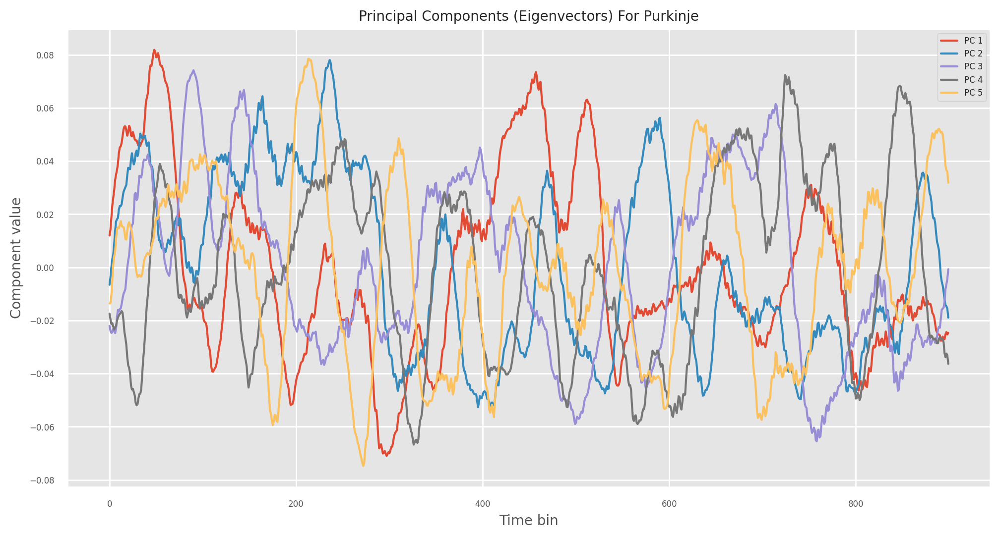

In [44]:
def plot_eigenvectors(pca, pop, n_components=3):
    plt.figure(figsize=(12, 6))
    for i in range(n_components):
        plt.plot(pca.components_[i], label=f'PC {i+1}')
    plt.xlabel('Time bin')
    plt.ylabel('Component value')
    plt.title(f'Principal Components (Eigenvectors) For {pop}')
    plt.legend()
    plt.show()

plot_eigenvectors(pca_pc, 'Purkinje', n_components=5)

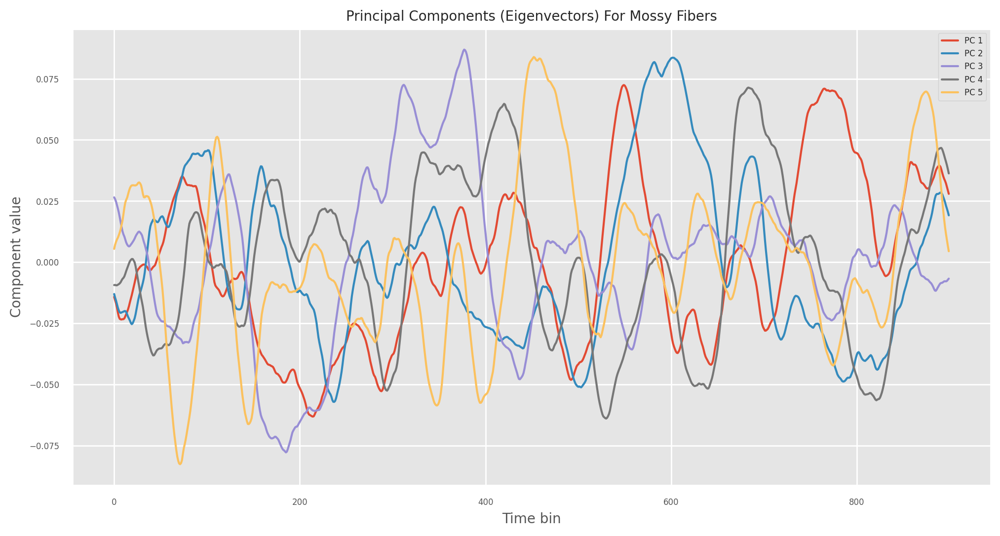

In [51]:
plot_eigenvectors(pca_mf, 'Mossy Fibers', n_components=5)

In [45]:
def fourier_trasformPCA(pca, n_components=3):
    """
    Perform Fourier Transform on PCA components.

    Args:
        pca: fitted PCA object
        n_components: number of principal components to transform

    Returns:
        freqs: frequencies corresponding to the Fourier Transform
        fft_values: Fourier Transform values
    """
    fft_values = []
    fft_freqs = []
    for i in range(n_components):
        fft_values.append(np.fft.rfft(pca.components_[i]))
        fft_freqs.append(np.fft.rfftfreq(pca.components_[i].shape[0]))
  
    return fft_freqs, fft_values

def plot_fourier_transform(fft_freqs, fft_values, pop, n_components=3):
    plt.figure(figsize=(12, 6))
    for i in range(n_components):
        plt.plot(fft_freqs[i], np.abs(fft_values[i]), label=f'PC {i+1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.title(f'Fourier Transform of PCA Components For {pop}')
    plt.legend()
    plt.show()

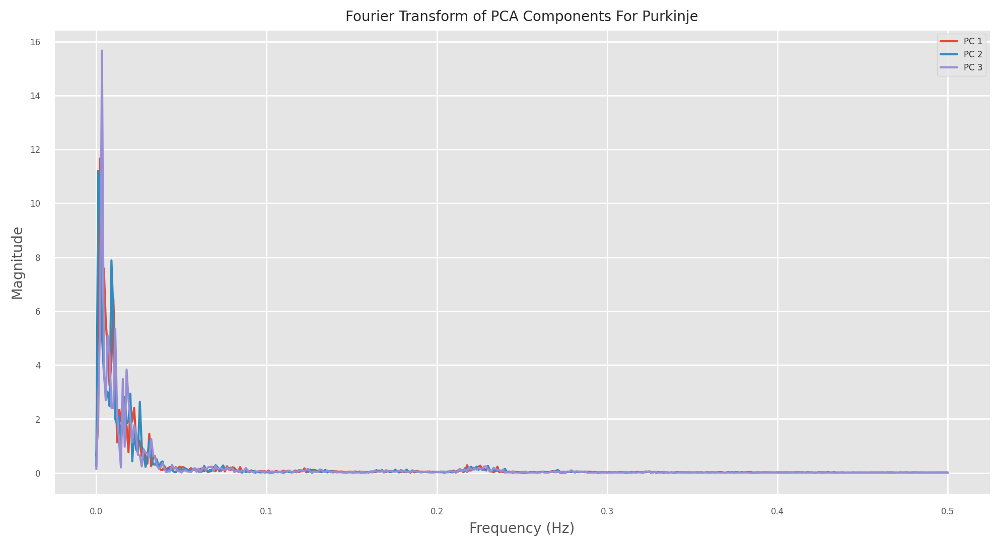

In [46]:
fft_freqs_pc, fft_values_pc = fourier_trasformPCA(pca_pc, n_components=3)
plot_fourier_transform(fft_freqs_pc, fft_values_pc, 'Purkinje', n_components=3)

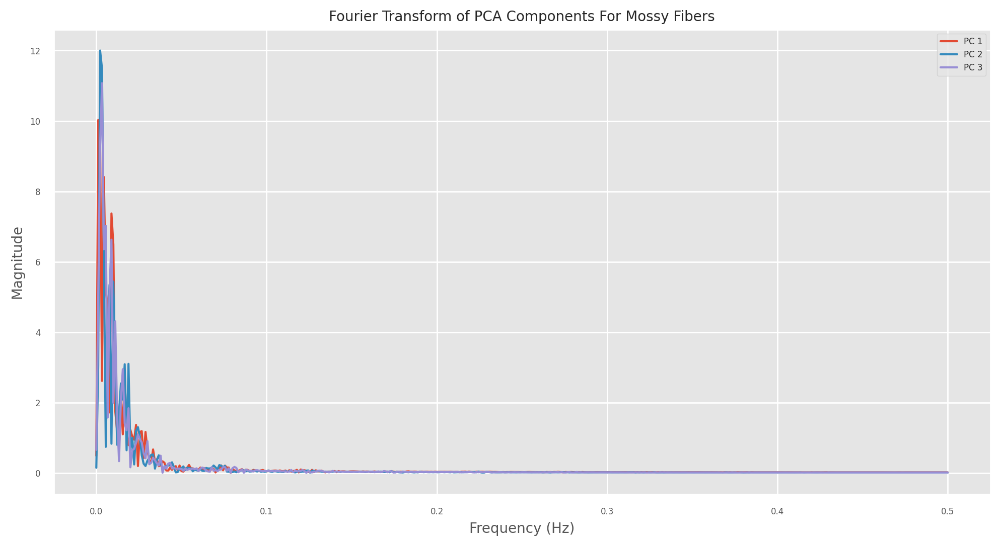

In [54]:
fft_freqs_mf, fft_values_mf = fourier_trasformPCA(pca_mf, n_components=3)
plot_fourier_transform(fft_freqs_mf, fft_values_mf, 'Mossy Fibers', n_components=3)

# More Spectral Analysis Using FOOF
The FOOOF object fits models to power spectra. The module itself does not compute power spectra. Computing power spectra needs to be done prior to using the FOOOF module. Thus I need to first compute the spectrum using Welch

Welch’s method [1] computes an estimate of the power spectral density by dividing the data into overlapping segments, computing a modified periodogram for each segment and averaging the periodograms

In [55]:
rates_per_neuronPC.shape

(68, 900)

In [47]:
from scipy.signal import welch

def compute_power_spectrum(rates_array, dt=5, nperseg=256):
    """
    Compute power spectrum using Welch's method.
    
    Args:
        rates_array: 2D numpy array of shape (n_neurons, n_time_bins)
        dt: time step in ms (from your firing rate computation)
        nperseg: length of each segment for Welch's method

    Returns:
        freqs: frequencies corresponding to the power spectrum (in Hz)
        psd: power spectral density values
    """
    # Calculate correct sampling frequency from your dt
    fs = 1000 / dt  # dt=5ms → fs=200Hz
    
    psd = []
    
    for neuron_rates in rates_array:
        f, p = welch(neuron_rates, fs=fs, nperseg=nperseg)
        psd.append(p)
    
    return f, np.array(psd) 

def plot_power_spectrum(freqs, psd, pop, n_neurons_to_plot=8):
    """
    Plot power spectrum for a given population.
    
    Args:
        freqs: frequencies corresponding to the power spectrum
        psd: power spectral density values (shape: n_neurons x n_freqs)
        pop: name of the population
        n_neurons_to_plot: number of neurons to plot
    """
    plt.figure(figsize=(12, 6))
    for i in range(n_neurons_to_plot):
        plt.plot(freqs, psd[i], label=f'Neuron {i}', alpha=0.5)
    
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power Spectral Density')
    plt.title(f'Power Spectrum for {pop}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

Frequency range: 0.00 - 100.00 Hz
PSD shape: (68, 257)


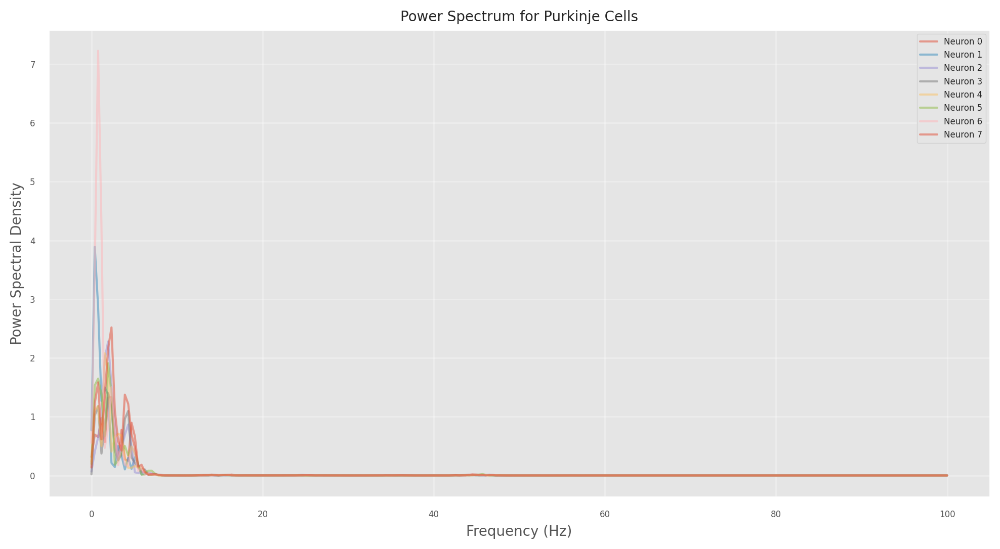

In [48]:
freqs_pc, psd_pc = compute_power_spectrum(rates_per_neuronPC, nperseg=512)

print(f"Frequency range: {freqs_pc[0]:.2f} - {freqs_pc[-1]:.2f} Hz")
print(f"PSD shape: {psd_pc.shape}")  # Should be (96, n_freq_bins)
plot_power_spectrum(freqs_pc, psd_pc, 'Purkinje Cells', n_neurons_to_plot=8)

In [ ]:
 """
    WHY: FOOOF separates neural spectra into:
    1. APERIODIC component (1/f background) - reflects E/I balance
    2. PERIODIC component (oscillatory peaks) - reflects rhythmic activity
    This decomposition reveals fundamental neural mechanisms.
    """

 """
        APERIODIC PARAMETERS:
        - Offset: Overall power level (log10 units)
        - Exponent: 1/f slope (steepness of power law decay)
        
        BIOLOGICAL MEANING:
        - Higher offset: More overall neural activity
        - More negative exponent: Better E/I balance, less noise
        """

In [49]:
from fooof import FOOOF

def extract_fooof_features(psd_data, freqs):
    """
    Extract comprehensive FOOOF features for each Purkinje cell
    """
    cell_features = []
    
    for cell_psd in psd_data:  # Loop through each cell's PSD
        fm = FOOOF(peak_width_limits=[1.0, 12.0], max_n_peaks=3)
        fm.fit(freqs, cell_psd, freq_range=[1, 50])
        
        # Aperiodic features
        offset = fm.aperiodic_params_[0] if len(fm.aperiodic_params_) > 0 else 0
        exponent = fm.aperiodic_params_[1] if len(fm.aperiodic_params_) > 1 else 0
        
        # Periodic features (pad to max 3 peaks)
        peak_features = np.zeros(9)
        n_detected_peaks = len(fm.peak_params_)
        
        if n_detected_peaks > 0:
            # Limit to maximum 3 peaks and flatten parameters
            n_peaks_to_use = min(n_detected_peaks, 3)
            peak_data = fm.peak_params_[:n_peaks_to_use].flatten()
            peak_features[:len(peak_data)] = peak_data
        
        # Additional derived features
        total_power = np.sum(cell_psd)
        relative_periodic_power = np.sum(fm._peak_fit) / total_power if total_power > 0 else 0
        
        # Combine all features
        features = np.concatenate([
            [offset, exponent],                    # Aperiodic (2)
            peak_features,                         # Periodic (9) 
            [total_power, relative_periodic_power] # Derived (2)
        ])
        
        cell_features.append(features)
    
    return np.array(cell_features)

fooof_features = extract_fooof_features(psd_pc, freqs_pc)
print(f"FOOOF feature matrix shape: {fooof_features.shape}")
fooof_features[0]


/tmp/ipykernel_31412/3679431817.py:1: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


FOOOF feature matrix shape: (68, 13)


array([-0.66967242,  2.73946181,  4.24866933,  2.61868208,  4.56237948,
       35.11115073,  2.53279291,  3.87152839, 45.05543036,  3.91077151,
        4.50352667, 10.10861256, 12.15716105])

In [54]:
def create_combined_feature_matrix_correlation(rates_per_neuron, temporal_covariance, fooof_features, pca_model, n_pca_components=10):
    """
    Combine features using the best of both approaches: dot product projections + correlation relationships
    """
    n_neurons = rates_per_neuron.shape[0]
    
    # 1. PCA features from temporal covariance
    pca = PCA(n_components=n_pca_components)
    pca_features = pca.fit_transform(temporal_covariance)
    
    
    # 3. PCA projection signatures (KEEP DOT PRODUCT - it's more correct!)
    neuron_pca_signatures = []
    for neuron_idx in range(n_neurons):
        neuron_rates = rates_per_neuron[neuron_idx]
        neuron_rates_centered = neuron_rates - np.mean(neuron_rates)
        
        # Project onto each PCA component using DOT PRODUCT (mathematically correct)
        signature = []
        for pc_idx in range(n_pca_components):
            temporal_pattern = pca.components_[pc_idx]
            if len(neuron_rates_centered) == len(temporal_pattern):
                projection = np.dot(neuron_rates_centered, temporal_pattern)
                signature.append(projection)
            else:
                signature.append(0)
        
        neuron_pca_signatures.append(signature)
    
    neuron_pca_signatures = np.array(neuron_pca_signatures)
    
    # 4. Neuron-to-neuron correlation features (FIXED BUG)
    n_reference_neurons = min(20, n_neurons - 1)
    reference_indices = np.linspace(0, n_neurons-1, n_reference_neurons, dtype=int)
    
    neuron_correlation_features = []
    for neuron_idx in range(n_neurons):
        neuron_rates = rates_per_neuron[neuron_idx]
        neuron_rates_centered = neuron_rates - np.mean(neuron_rates)
        
        # Correlations with fixed set of reference neurons
        other_neuron_corrs = []
        for ref_idx in reference_indices:
            if ref_idx != neuron_idx:
                other_rates = rates_per_neuron[ref_idx]
                other_rates_centered = other_rates - np.mean(other_rates)
                corr = np.corrcoef(neuron_rates_centered, other_rates_centered)[0, 1]
                other_neuron_corrs.append(corr if not np.isnan(corr) else 0)
            else:
                other_neuron_corrs.append(0)
        
        # Ensure consistent length
        other_neuron_corrs = other_neuron_corrs[:n_reference_neurons]
        while len(other_neuron_corrs) < n_reference_neurons:
            other_neuron_corrs.append(0)
        
        # Population correlation
        pop_mean = np.mean(rates_per_neuron, axis=0)
        pop_corr = np.corrcoef(neuron_rates_centered, pop_mean)[0, 1]
        pop_corr = pop_corr if not np.isnan(pop_corr) else 0
        
        # Autocorrelation pattern
        autocorr = np.correlate(neuron_rates_centered, neuron_rates_centered, mode='full')
        autocorr = autocorr[autocorr.size // 2:][:20]
        autocorr_normalized = (autocorr - np.mean(autocorr)) / (np.std(autocorr) + 1e-8)
        
        # KEEP YOUR IMPROVED DERIVATIVE FEATURES (they're valuable!)
        neuron_normalized = neuron_rates_centered / (np.std(neuron_rates_centered) + 1e-8)
        
        first_diff = np.diff(neuron_normalized)
        second_diff = np.diff(first_diff) if len(first_diff) > 1 else np.array([0])
        
        shape_features = [
            np.mean(np.abs(first_diff)),                              # Smoothness
            np.std(first_diff),                                       # Variability of changes
            np.mean(np.abs(second_diff)),                             # Curvature
            np.std(second_diff),                                      # Variability in acceleration
        ]
        
        # Combine correlation features
        neuron_corr_features = np.concatenate([
            other_neuron_corrs,      # Reference neuron correlations
            [pop_corr],              # Population correlation
            autocorr_normalized,     # Autocorrelation pattern
            shape_features           # Enhanced temporal dynamics
        ])
        
        neuron_correlation_features.append(neuron_corr_features)
    
    neuron_correlation_features = np.array(neuron_correlation_features)
    
    # 5. Combine all features
    combined_features = np.concatenate([
        neuron_pca_signatures,        # DOT PRODUCT projections (correct!)
        neuron_correlation_features,  # Fixed correlations + enhanced dynamics, # PCA variance features
        fooof_features               # Spectral features
    ], axis=1)
    
    print(f"Enhanced combined feature matrix shape: {combined_features.shape}")
    print(f"  - PCA projection features: {neuron_pca_signatures.shape[1]} (dot product based)")
    print(f"  - Neuron correlation features: {neuron_correlation_features.shape[1]}")
    print(f"    └─ Reference neuron correlations: {n_reference_neurons}")
    print(f"    └─ Population correlation: 1")
    print(f"    └─ Autocorrelation features: 20")
    print(f"    └─ Enhanced temporal dynamics: 8")
    print(f"  - FOOOF features: {fooof_features.shape[1]}")
    
    return combined_features, pca

In [55]:
combined_features_corr, pca_temporal = create_combined_feature_matrix_correlation(
    rates_per_neuronPC, 
    temporal_covariancePC, 
    fooof_features, 
    pca_pc,  # <-- Add your existing PCA model here
    n_pca_components=15
)

Enhanced combined feature matrix shape: (68, 73)
  - PCA projection features: 15 (dot product based)
  - Neuron correlation features: 45
    └─ Reference neuron correlations: 20
    └─ Population correlation: 1
    └─ Autocorrelation features: 20
    └─ Enhanced temporal dynamics: 8
  - FOOOF features: 13


In [56]:
print(combined_features_corr[0])
print(min(combined_features_corr[0]))
print(max(combined_features_corr[0]))

[ 3.74313573e-01  3.95689185e+00  1.01091749e+00 -2.10896904e+01
  1.56536229e+01  2.81422848e+01 -2.01783276e+01  4.77473458e-01
  9.61100099e+00  2.07401308e+01 -6.18483923e-01 -1.25156545e+00
 -1.52201017e+01 -1.10170711e+01  4.34073075e+00  0.00000000e+00
 -5.42479393e-02  8.53731688e-02  2.15434150e-03  8.38043051e-02
  5.40855784e-02  2.85425873e-01  1.17077897e-01 -1.72069989e-01
  7.31204214e-02  2.70290734e-01 -1.70674726e-01  8.79313376e-02
  1.93704359e-01 -3.23340164e-01 -2.83037825e-01 -2.87467585e-02
  3.33056733e-02 -7.42385621e-02  1.25601381e-01  2.20833927e-01
  1.29978489e+00  1.25245383e+00  1.16594743e+00  1.09860990e+00
  1.03037196e+00  9.09111502e-01  7.38905790e-01  5.74407664e-01
  4.31393757e-01  2.66787941e-01  5.46129184e-02 -1.68477715e-01
 -3.62100089e-01 -5.47092281e-01 -7.65291979e-01 -1.00582246e+00
 -1.21959190e+00 -1.39628595e+00 -1.57671925e+00 -1.78100596e+00
  1.26811564e-01  1.61099387e-01  1.46885302e-01  1.68178298e-01
 -6.69672422e-01  2.73946

In [57]:
from sklearn.preprocessing import StandardScaler

transform = StandardScaler()
scaled_original_features = transform.fit_transform(combined_features_corr)
print(f"Scaled feature matrix shape: {scaled_original_features.shape}")
print(f"  - Mean: {np.mean(scaled_original_features)}")
print(f"  - Std: {np.std(scaled_original_features)}")
print(f"  - Min: {np.min(scaled_original_features)}")
print(f"  - Max: {np.max(scaled_original_features)}")

Scaled feature matrix shape: (68, 73)
  - Mean: -1.5924230329031255e-15
  - Std: 1.0
  - Min: -4.7033026571012915
  - Max: 3.648356184005181


<Axes: ylabel='Count'>

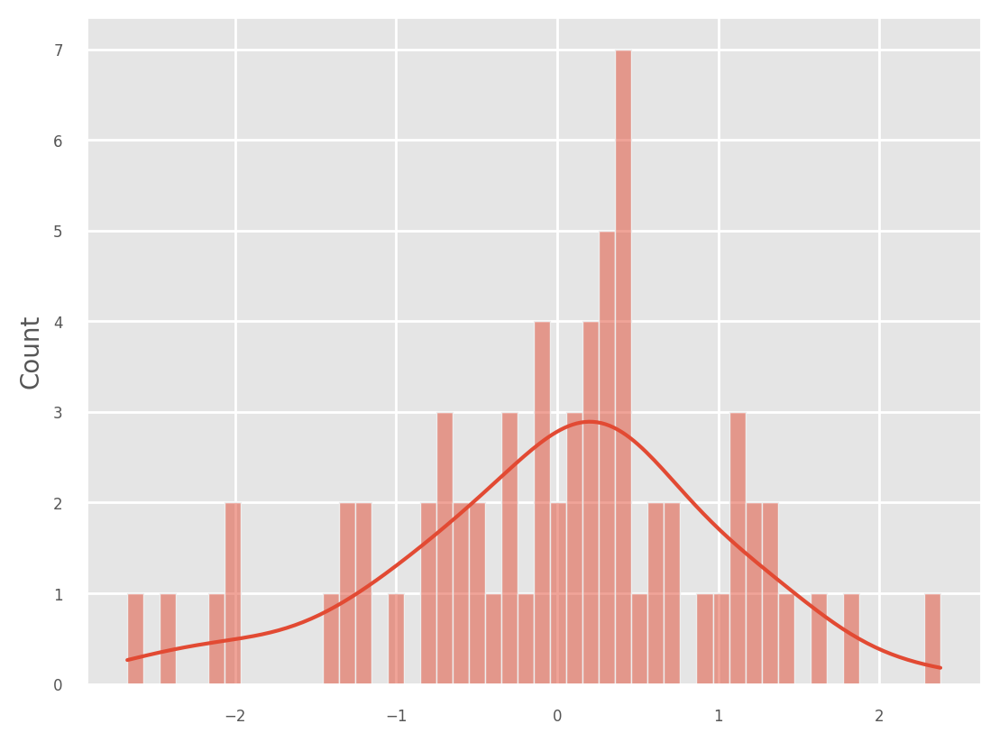

In [58]:
sns.histplot(scaled_original_features[:, 0], bins=50, kde=True)

In [110]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [59]:
from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn as nn
import torch.nn.functional as F

def augment_standardized_features(scaled_features, noise_level=0.01, n_augmented=3):
    """
    Augment already-standardized features
    """
    augmented = [scaled_features]
    
    for _ in range(n_augmented):
        # Add noise to standardized features (preserves scale)
        noisy_features = scaled_features + np.random.normal(0, noise_level, scaled_features.shape)
        augmented.append(noisy_features)
        
        # Bootstrap sampling
        n_neurons = scaled_features.shape[0]
        bootstrap_indices = np.random.choice(n_neurons, n_neurons, replace=True)
        bootstrap_features = scaled_features[bootstrap_indices]
        augmented.append(bootstrap_features)
    
    return np.vstack(augmented)

# Step 3: Apply augmentation to standardized data
augmented_scaled_features = augment_standardized_features(scaled_original_features, n_augmented=3)

print(f"Original features shape: {combined_features_corr.shape}")
print(f"Scaled original features shape: {scaled_original_features.shape}")
print(f"Augmented scaled features shape: {augmented_scaled_features.shape}")

# Step 4: Use augmented standardized features for training
tensor_data = torch.FloatTensor(augmented_scaled_features).to(device)
dataset = TensorDataset(tensor_data)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

Original features shape: (68, 73)
Scaled original features shape: (68, 73)
Augmented scaled features shape: (476, 73)


RuntimeError: Expected one of cpu, cuda, ipu, xpu, mkldnn, opengl, opencl, ideep, hip, ve, fpga, maia, xla, lazy, vulkan, mps, meta, hpu, mtia, privateuseone device type at start of device string: stellate_record

In [112]:
class CerebellarAutoEncoder(nn.Module):
    """
    Simple Autoencoder for neural feature compression and clustering
    """
    def __init__(self, input_dim, latent_dim=16, hidden_dims=[64, 32]):
        super(CerebellarAutoEncoder, self).__init__()
        
        self.input_dim = input_dim
        self.latent_dim = latent_dim
        
        # Encoder
        encoder_layers = []
        current_dim = input_dim
        
        for hidden_dim in hidden_dims:
            encoder_layers.extend([
                nn.Linear(current_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(0.1)  # Light regularization
            ])
            current_dim = hidden_dim
        
        # Bottleneck layer
        encoder_layers.append(nn.Linear(current_dim, latent_dim))
        self.encoder = nn.Sequential(*encoder_layers)
        
        # Decoder (mirror of encoder)
        decoder_layers = []
        current_dim = latent_dim
        
        for hidden_dim in reversed(hidden_dims):
            decoder_layers.extend([
                nn.Linear(current_dim, hidden_dim),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
            current_dim = hidden_dim
        
        decoder_layers.append(nn.Linear(current_dim, input_dim))
        self.decoder = nn.Sequential(*decoder_layers)
    
    def encode(self, x):
        """Encode input to latent representation"""
        return self.encoder(x)
    
    def decode(self, z):
        """Decode latent representation to reconstruction"""
        return self.decoder(z)
    
    def forward(self, x):
        latent = self.encode(x)
        reconstruction = self.decode(latent)
        return reconstruction, latent

def simple_autoencoder_loss(recon_x, x):
    """Simple reconstruction loss"""
    return F.mse_loss(recon_x, x, reduction='mean')

In [129]:
class CerebellarDEC(nn.Module):
    """
    Deep Embedded Clustering - combines autoencoder with clustering loss
    """
    def __init__(self, input_dim, latent_dim=10, hidden_dims=[128, 64, 32], n_clusters=3):
        super(CerebellarDEC, self).__init__()
        
        self.latent_dim = latent_dim
        self.n_clusters = n_clusters
        
        # Encoder
        encoder_layers = []
        current_dim = input_dim
        
        for hidden_dim in hidden_dims:
            encoder_layers.extend([
                nn.Linear(current_dim, hidden_dim),
                nn.BatchNorm1d(hidden_dim),  # Added batch norm
                nn.ReLU(),
                nn.Dropout(0.2)
            ])
            current_dim = hidden_dim
        
        encoder_layers.append(nn.Linear(current_dim, latent_dim))
        self.encoder = nn.Sequential(*encoder_layers)
        
        # Decoder
        decoder_layers = []
        current_dim = latent_dim
        
        for hidden_dim in reversed(hidden_dims):
            decoder_layers.extend([
                nn.Linear(current_dim, hidden_dim),
                nn.BatchNorm1d(hidden_dim),
                nn.ReLU(),
                nn.Dropout(0.2)
            ])
            current_dim = hidden_dim
        
        decoder_layers.append(nn.Linear(current_dim, input_dim))
        self.decoder = nn.Sequential(*decoder_layers)
        
        # Clustering layer
        self.cluster_centers = nn.Parameter(torch.randn(n_clusters, latent_dim))
        
    def encode(self, x):
        return self.encoder(x)
    
    def decode(self, z):
        return self.decoder(z)
    
    def forward(self, x):
        latent = self.encode(x)
        reconstruction = self.decode(latent)
        
        # Compute cluster assignments
        distances = torch.sum((latent.unsqueeze(1) - self.cluster_centers.unsqueeze(0))**2, dim=2)
        cluster_probs = F.softmax(-distances, dim=1)
        
        return reconstruction, latent, cluster_probs

def dec_loss(recon_x, x, cluster_probs, target_dist, alpha=1.0, beta=0.1):
    """
    Combined reconstruction + clustering loss
    """
    # Reconstruction loss
    recon_loss = F.mse_loss(recon_x, x, reduction='mean')
    
    # Clustering loss (KL divergence)
    kl_loss = F.kl_div(cluster_probs.log(), target_dist, reduction='batchmean')
    
    return recon_loss + alpha * kl_loss

def compute_target_distribution(cluster_probs):
    """
    Compute target distribution for clustering (auxiliary target distribution)
    """
    weight = cluster_probs ** 2 / cluster_probs.sum(0)
    return (weight.t() / weight.sum(1)).t()


In [122]:
lr = 0.001
input_dim = augmented_scaled_features.shape[1]
latent_dim = 8
hidden_dims = [64, 32]
vae = CerebellarAutoEncoder(input_dim, latent_dim, hidden_dims).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=lr)

In [123]:
sample = next(iter(dataloader))
sample[0].shape


torch.Size([16, 79])

In [125]:
def train_simple_autoencoder(model, dataloader, epochs=200, lr=0.001, batch_size=16):
    """
    Train simple autoencoder with minimal augmentation
    """
    train_losses = []
    model.train()
    
    for epoch in range(epochs):
        epoch_loss = 0.0
        
        for batch in dataloader:
            x = batch[0].to(device)
            
            optimizer.zero_grad()
            recon_x, latent = model(x)
            loss = simple_autoencoder_loss(recon_x, x)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        avg_loss = epoch_loss / len(dataloader)
        train_losses.append(avg_loss)
        
        if (epoch + 1) % 20 == 0:
            print(f"Epoch [{epoch + 1}/{epochs}], Loss: {avg_loss:.6f}")
    
    return model, train_losses

In [126]:
trained_model , train_losses = train_simple_autoencoder(vae, dataloader, epochs=200, lr=0.001, batch_size=16)

Epoch [20/200], Loss: 0.415449
Epoch [40/200], Loss: 0.330672
Epoch [60/200], Loss: 0.288482
Epoch [80/200], Loss: 0.261329
Epoch [100/200], Loss: 0.242734
Epoch [120/200], Loss: 0.224521
Epoch [140/200], Loss: 0.216105
Epoch [160/200], Loss: 0.214850
Epoch [180/200], Loss: 0.200310
Epoch [200/200], Loss: 0.191200


In [130]:
def train_dec_autoencoder(model, dataloader, epochs=300, lr=0.001):
    """
    Two-stage training: pretraining + joint optimization
    """
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.9)
    
    # Stage 1: Pretrain autoencoder (first 100 epochs)
    print("Stage 1: Pretraining autoencoder...")
    model.train()
    
    for epoch in range(100):
        epoch_loss = 0.0
        
        for batch in dataloader:
            x = batch[0].to(device)
            
            optimizer.zero_grad()
            recon_x, latent, _ = model(x)
            loss = F.mse_loss(recon_x, x)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        if (epoch + 1) % 20 == 0:
            print(f"Pretrain Epoch [{epoch + 1}/100], Loss: {epoch_loss/len(dataloader):.6f}")
    
    # Stage 2: Joint optimization (reconstruction + clustering)
    print("Stage 2: Joint optimization...")
    
    for epoch in range(100, epochs):
        epoch_loss = 0.0
        
        for batch in dataloader:
            x = batch[0].to(device)
            
            optimizer.zero_grad()
            recon_x, latent, cluster_probs = model(x)
            
            # Compute target distribution
            target_dist = compute_target_distribution(cluster_probs.detach())
            
            # Combined loss
            loss = dec_loss(recon_x, x, cluster_probs, target_dist)
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
        
        scheduler.step()
        
        if (epoch + 1) % 20 == 0:
            print(f"Joint Epoch [{epoch + 1}/{epochs}], Loss: {epoch_loss/len(dataloader):.6f}")
    
    return model


In [135]:
# Better hyperparameters
model_DEC = CerebellarDEC(
    input_dim=input_dim,
    latent_dim=8,  # Smaller latent space for better clustering
    hidden_dims=[256, 128, 64],  # Deeper network
    n_clusters=3
)
model_DEC.to(device)

# Better training setup
optimizer = torch.optim.Adam(model_DEC.parameters(), lr=0.0005, weight_decay=1e-4)


In [136]:
model_trained_2 = train_dec_autoencoder(model_DEC, dataloader, epochs=300, lr=0.0005)

Stage 1: Pretraining autoencoder...
Pretrain Epoch [20/100], Loss: 0.478437
Pretrain Epoch [40/100], Loss: 0.402283
Pretrain Epoch [60/100], Loss: 0.373408
Pretrain Epoch [80/100], Loss: 0.346592
Pretrain Epoch [100/100], Loss: 0.332814
Stage 2: Joint optimization...
Joint Epoch [120/300], Loss: 0.358323
Joint Epoch [140/300], Loss: 0.304211
Joint Epoch [160/300], Loss: 0.314574
Joint Epoch [180/300], Loss: 0.309663
Joint Epoch [200/300], Loss: 0.291215
Joint Epoch [220/300], Loss: 0.284849
Joint Epoch [240/300], Loss: 0.292919
Joint Epoch [260/300], Loss: 0.269284
Joint Epoch [280/300], Loss: 0.266377
Joint Epoch [300/300], Loss: 0.259750


In [138]:
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

def analyze_autoencoder_clusters(model, features, scaler, n_clusters=3):
    """
    Analyze neuron clusters using autoencoder latent space
    """
    
    model.eval()
    with torch.no_grad():
        # Get latent representations for original features only
        features_scaled = scaler.transform(features)
        tensor_features = torch.FloatTensor(features_scaled)
        
        # Move to same device as model
        device = next(model.parameters()).device
        tensor_features = tensor_features.to(device)
        
        _, latent_representations, _ = model(tensor_features)
        
        # Move back to CPU for numpy operations
        latent_np = latent_representations.cpu().numpy()
    
    # Rest of the function remains the same...
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(latent_np)
    
    # Visualizations
    fig, axes = plt.subplots(2, 2, figsize=(15, 12), dpi=300)
    
    # 1. Latent space (first 2 dimensions)
    scatter1 = axes[0, 0].scatter(latent_np[:, 0], latent_np[:, 1], 
                                  c=cluster_labels, cmap='viridis', alpha=0.7, s=60)
    axes[0, 0].set_title('Autoencoder Latent Space (Dims 1-2)')
    axes[0, 0].set_xlabel('Latent Dim 1')
    axes[0, 0].set_ylabel('Latent Dim 2')
    
    # Add neuron labels
    for i, (x, y) in enumerate(latent_np[:, :2]):
        axes[0, 0].annotate(f'{i}', (x, y), xytext=(2, 2), 
                           textcoords='offset points', fontsize=8, alpha=0.7)
    
    # 2. t-SNE visualization
    if latent_np.shape[1] > 2:
        tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(features)-1))
        tsne_embedding = tsne.fit_transform(latent_np)
        
        scatter2 = axes[0, 1].scatter(tsne_embedding[:, 0], tsne_embedding[:, 1], 
                                     c=cluster_labels, cmap='viridis', alpha=0.7, s=60)
        axes[0, 1].set_title('t-SNE of Latent Space')
        axes[0, 1].set_xlabel('t-SNE 1')
        axes[0, 1].set_ylabel('t-SNE 2')
    
    # 3. Cluster size analysis
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    axes[1, 0].bar(unique_labels, counts, color=['red', 'blue', 'green'][:len(unique_labels)])
    axes[1, 0].set_title('Cluster Sizes')
    axes[1, 0].set_xlabel('Cluster ID')
    axes[1, 0].set_ylabel('Number of Neurons')
    
    # 4. Reconstruction quality per cluster
    model.eval()
    with torch.no_grad():
        recon_features, _ = model(tensor_features)
        reconstruction_errors = torch.mean((tensor_features - recon_features)**2, dim=1).cpu().numpy()
    
    for cluster_id in unique_labels:
        cluster_mask = cluster_labels == cluster_id
        cluster_errors = reconstruction_errors[cluster_mask]
        axes[1, 1].hist(cluster_errors, alpha=0.7, label=f'Cluster {cluster_id}', bins=15)
    
    axes[1, 1].set_title('Reconstruction Error by Cluster')
    axes[1, 1].set_xlabel('Mean Squared Error')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].legend()
    
    plt.tight_layout()
    plt.show()
    
    # Print cluster statistics
    print("\n" + "="*50)
    print("CLUSTER ANALYSIS RESULTS")
    print("="*50)
    
    for cluster_id in unique_labels:
        cluster_mask = cluster_labels == cluster_id
        cluster_neurons = np.where(cluster_mask)[0]
        cluster_errors = reconstruction_errors[cluster_mask]
        
        print(f"\nCluster {cluster_id}: {counts[cluster_id]} neurons")
        print(f"  Neurons: {cluster_neurons[:10]}{'...' if len(cluster_neurons) > 10 else ''}")
        print(f"  Mean reconstruction error: {np.mean(cluster_errors):.6f} ± {np.std(cluster_errors):.6f}")
    
    return latent_np, cluster_labels, reconstruction_errors


Analyzing clusters...


ValueError: too many values to unpack (expected 2)

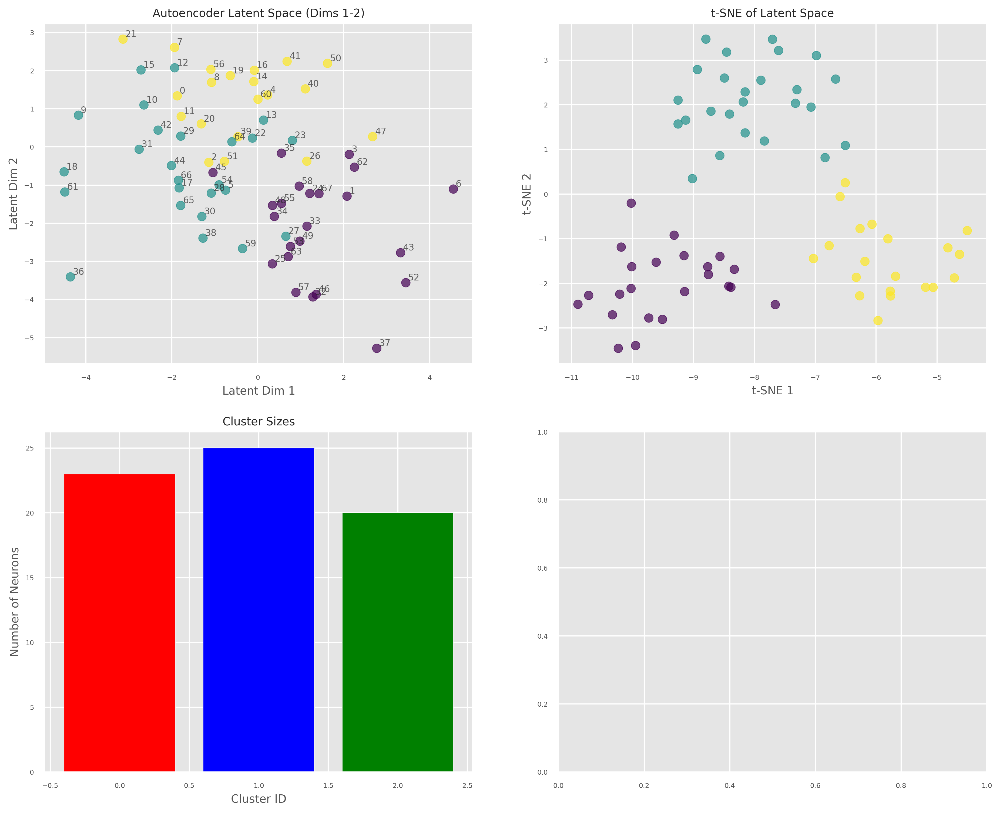

In [139]:
print("\nAnalyzing clusters...")
latent_space, clusters, recon_errors = analyze_autoencoder_clusters(
    model_trained_2, 
    combined_features_corr, 
    transform, 
    n_clusters=3
)

In [140]:
def analyze_cerebellar_dec_clusters(model, features, scaler):
    """
    Analyze clusters using the CerebellarDEC model's inherent clustering
    """
    model.eval()
    device = next(model.parameters()).device
    
    with torch.no_grad():
        # Transform and move data
        features_scaled = scaler.transform(features)
        tensor_features = torch.FloatTensor(features_scaled).to(device)
        
        # Get model outputs
        recon_features, latent, cluster_probs = model(tensor_features)
        
        # Convert to numpy arrays
        latent_np = latent.cpu().numpy()
        cluster_labels = torch.argmax(cluster_probs, dim=1).cpu().numpy()
        reconstruction_errors = torch.mean((tensor_features - recon_features)**2, dim=1).cpu().numpy()

    # Visualization
    fig, axes = plt.subplots(2, 2, figsize=(15, 12), dpi=300)
    
    # 1. Model's latent space with DEC clusters
    scatter1 = axes[0, 0].scatter(latent_np[:, 0], latent_np[:, 1], 
                                c=cluster_labels, cmap='viridis', alpha=0.7, s=60)
    axes[0, 0].set_title('DEC Latent Space Clustering')
    axes[0, 0].set_xlabel('Latent Dim 1')
    axes[0, 0].set_ylabel('Latent Dim 2')
    
    # 2. t-SNE visualization
    tsne = TSNE(n_components=2, random_state=42)
    tsne_embedding = tsne.fit_transform(latent_np)
    scatter2 = axes[0, 1].scatter(tsne_embedding[:, 0], tsne_embedding[:, 1],
                                c=cluster_labels, cmap='viridis', alpha=0.7, s=60)
    axes[0, 1].set_title('t-SNE of DEC Latent Space')
    axes[0, 1].set_xlabel('t-SNE 1')
    axes[0, 1].set_ylabel('t-SNE 2')

    # 3. Cluster size distribution
    unique_labels, counts = np.unique(cluster_labels, return_counts=True)
    axes[1, 0].bar(unique_labels, counts, 
                  color=plt.cm.viridis(np.linspace(0, 1, len(unique_labels))))
    axes[1, 0].set_title('Cluster Size Distribution')
    axes[1, 0].set_xlabel('Cluster ID')
    axes[1, 0].set_ylabel('Number of Neurons')

    # 4. Reconstruction error analysis
    for cluster_id in unique_labels:
        cluster_mask = cluster_labels == cluster_id
        axes[1, 1].hist(reconstruction_errors[cluster_mask], 
                       bins=20, alpha=0.7, 
                       label=f'Cluster {cluster_id}')
    axes[1, 1].set_title('Reconstruction Error by Cluster')
    axes[1, 1].set_xlabel('Reconstruction Error')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].legend()

    plt.tight_layout()
    plt.show()

    # Cluster statistics
    print("\n" + "="*50)
    print("CEREBELLAR DEC CLUSTER ANALYSIS")
    print("="*50)
    
    for cluster_id in unique_labels:
        cluster_mask = cluster_labels == cluster_id
        cluster_neurons = np.where(cluster_mask)[0]
        
        print(f"\nCluster {cluster_id}:")
        print(f"  Neurons: {len(cluster_neurons)}")
        print(f"  Mean reconstruction error: {np.mean(reconstruction_errors[cluster_mask]):.4f} ± {np.std(reconstruction_errors[cluster_mask]):.4f}")
        print(f"  Neuron indices: {cluster_neurons[:10]}{'...' if len(cluster_neurons)>10 else ''}")

    return latent_np, cluster_labels, reconstruction_errors


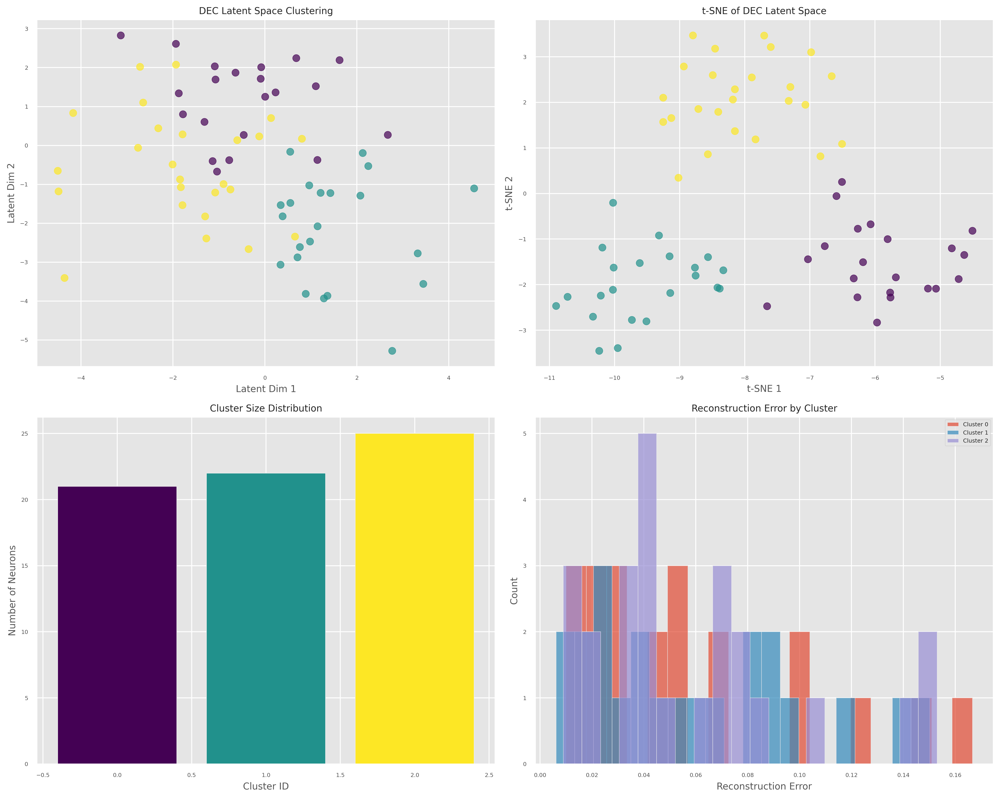


CEREBELLAR DEC CLUSTER ANALYSIS

Cluster 0:
  Neurons: 21
  Mean reconstruction error: 0.0578 ± 0.0440
  Neuron indices: [ 0  2  4  7  8 11 14 16 19 20]...

Cluster 1:
  Neurons: 22
  Mean reconstruction error: 0.0589 ± 0.0409
  Neuron indices: [ 1  3  6 24 25 32 33 34 35 37]...

Cluster 2:
  Neurons: 25
  Mean reconstruction error: 0.0599 ± 0.0402
  Neuron indices: [ 5  9 10 12 13 15 17 18 22 23]...


In [142]:
latent, clusters, errors = analyze_cerebellar_dec_clusters(
    model=model_trained_2,
    features=combined_features_corr,
    scaler=transform
)

In [101]:
def characterize_basal_activity_states(combined_features, cluster_labels, feature_names):
    """
    Characterize what each cluster represents in terms of basal activity
    """
    cluster_characteristics = {}
    
    for cluster_id in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster_id
        cluster_features = combined_features[cluster_mask]
        
        # Statistical characterization based on your actual feature structure:
        # Features 0-14: PCA projection features (15)
        # Features 15-58: Neuron correlation features (44) 
        # Features 59-62: PCA variance features (4)
        # Features 63-77: FOOOF spectral features (15)
        
        cluster_profile = {
            'cluster_size': np.sum(cluster_mask),
            'percentage': np.sum(cluster_mask) / len(cluster_labels) * 100,
            
            # PCA projection features (first 15 features)
            'temporal_correlation_strength': np.mean(cluster_features[:, :15]),
            'temporal_correlation_variability': np.std(cluster_features[:, :15]),
            
            # Neuron correlation features (features 15-58)
            'network_connectivity': np.mean(cluster_features[:, 15:59]),
            'network_connectivity_std': np.std(cluster_features[:, 15:59]),
            
            # PCA variance features (features 59-62)
            'temporal_variance_explained': np.mean(cluster_features[:, 59:63]),
            
            # FOOOF spectral features (features 63-77)
            'mean_spectral_exponent': np.mean(cluster_features[:, 64:65]),  # Exponent is 2nd FOOOF feature
            'mean_spectral_offset': np.mean(cluster_features[:, 63:64]),    # Offset is 1st FOOOF feature
            'spectral_rhythmicity': np.mean(cluster_features[:, 65:77]),    # Peak features
            'spectral_power': np.mean(cluster_features[:, 75:77]),          # Total and relative power
        }
        
        cluster_characteristics[f'Basal_State_{cluster_id}'] = cluster_profile
    
    return cluster_characteristics

# Characterize your basal states
basal_states = characterize_basal_activity_states(
    combined_features_corr, 
    clusters, 
    feature_names=['pca_projection', 'neuron_correlation', 'pca_variance', 'spectral']
)

# Print characterization with corrected field names
for state_name, profile in basal_states.items():
    print(f"\n{state_name}:")
    print(f"  Population: {profile['percentage']:.1f}% of neurons")
    print(f"  Temporal correlation: {profile['temporal_correlation_strength']:.3f} ± {profile['temporal_correlation_variability']:.3f}")
    print(f"  Network connectivity: {profile['network_connectivity']:.3f} ± {profile['network_connectivity_std']:.3f}")
    print(f"  Temporal variance explained: {profile['temporal_variance_explained']:.3f}")
    print(f"  Spectral exponent: {profile['mean_spectral_exponent']:.3f}")
    print(f"  Spectral offset: {profile['mean_spectral_offset']:.3f}")
    print(f"  Spectral rhythmicity: {profile['spectral_rhythmicity']:.3f}")
    print(f"  Spectral power: {profile['spectral_power']:.3f}")


Basal_State_0:
  Population: 41.2% of neurons
  Temporal correlation: 0.269 ± 14.615
  Network connectivity: 0.011 ± 0.683
  Temporal variance explained: 0.153
  Spectral exponent: 34.892
  Spectral offset: 0.160
  Spectral rhythmicity: 7.584
  Spectral power: 17.869

Basal_State_1:
  Population: 10.3% of neurons
  Temporal correlation: 2.369 ± 16.790
  Network connectivity: 0.032 ± 0.683
  Temporal variance explained: 0.148
  Spectral exponent: 34.892
  Spectral offset: 0.143
  Spectral rhythmicity: 8.081
  Spectral power: 8.694

Basal_State_2:
  Population: 48.5% of neurons
  Temporal correlation: 1.621 ± 12.992
  Network connectivity: 0.027 ± 0.683
  Temporal variance explained: 0.157
  Spectral exponent: 34.892
  Spectral offset: 0.163
  Spectral rhythmicity: 8.634
  Spectral power: 13.606


In [97]:
def analyze_firing_rate_clusters(rates_per_neuron, cluster_labels):
    """
    Check if clusters correspond to different firing rate regimes
    """
    mean_rates = np.mean(rates_per_neuron, axis=1)
    
    for cluster_id in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster_id
        cluster_rates = mean_rates[cluster_mask]
        
        print(f"Cluster {cluster_id}:")
        print(f"  Mean firing rate: {np.mean(cluster_rates):.2f} ± {np.std(cluster_rates):.2f} Hz")
        print(f"  Range: {np.min(cluster_rates):.2f} - {np.max(cluster_rates):.2f} Hz")
        print(f"  Neurons: {np.sum(cluster_mask)}")

# Check your current clusters
analyze_firing_rate_clusters(rates_per_neuronPC, clusters)

Cluster 0:
  Mean firing rate: 46.31 ± 1.14 Hz
  Range: 44.28 - 48.94 Hz
  Neurons: 28
Cluster 1:
  Mean firing rate: 46.96 ± 0.84 Hz
  Range: 45.38 - 47.97 Hz
  Neurons: 7
Cluster 2:
  Mean firing rate: 46.51 ± 1.07 Hz
  Range: 43.93 - 48.98 Hz
  Neurons: 33


In [102]:
def analyze_cluster_feature_contributions(combined_features_corr, clusters, feature_names=None):
    """
    Analyze what features drive each cluster
    """
    n_features = combined_features_corr.shape[1]
    
    # Define feature groups based on your actual pipeline:
    # From your output: 83 total features
    # - PCA projection features: 15 (dot product based)
    # - Neuron correlation features: 49 total
    #   └─ Reference neuron correlations: 20
    #   └─ Population correlation: 1  
    #   └─ Autocorrelation features: 20
    #   └─ Shape & dynamics features: 8
    # - PCA variance features: 4
    # - FOOOF features: 15
    
    feature_groups = {
        'PCA_projections': slice(0, 15),           # Features 0-14: PCA dot product projections
        'Reference_correlations': slice(15, 35),   # Features 15-34: Correlations with reference neurons
        'Population_correlation': slice(35, 36),   # Feature 35: Population correlation
        'Autocorrelation_patterns': slice(36, 56), # Features 36-55: Autocorrelation features
        'Temporal_dynamics': slice(56, 64),        # Features 56-63: Shape & dynamics features
        'PCA_variance': slice(64, 68),             # Features 64-67: PCA variance features
        'FOOOF_spectral': slice(68, 83)            # Features 68-82: FOOOF spectral features
    }
    
    print("="*60)
    print("CLUSTER FEATURE ANALYSIS")
    print("="*60)
    print(f"Total features: {n_features}")
    
    for cluster_id in np.unique(clusters):
        cluster_mask = clusters == cluster_id
        cluster_features = combined_features_corr[cluster_mask]
        
        print(f"\n🔹 CLUSTER {cluster_id} ({np.sum(cluster_mask)} neurons)")
        print("-" * 40)
        
        for group_name, feature_slice in feature_groups.items():
            group_features = cluster_features[:, feature_slice]
            group_mean = np.mean(group_features, axis=0)
            group_std = np.std(group_features, axis=0)
            
            print(f"{group_name}:")
            print(f"  Mean: {np.mean(group_mean):.4f} ± {np.mean(group_std):.4f}")
            print(f"  Range: [{np.min(group_mean):.4f}, {np.max(group_mean):.4f}]")
            print(f"  Features: {feature_slice.start}-{feature_slice.stop-1}")
        
        # Most distinctive features for this cluster
        all_other_mask = ~cluster_mask
        if np.sum(all_other_mask) > 0:
            other_features = combined_features_corr[all_other_mask]
            
            # Compute effect sizes (Cohen's d) for each feature
            cluster_means = np.mean(cluster_features, axis=0)
            other_means = np.mean(other_features, axis=0)
            pooled_std = np.sqrt((np.var(cluster_features, axis=0) + np.var(other_features, axis=0)) / 2)
            
            effect_sizes = (cluster_means - other_means) / (pooled_std + 1e-8)
            
            # Find most distinctive features
            top_distinctive = np.argsort(np.abs(effect_sizes))[-5:]
            
            print(f"\n  Most distinctive features (Cohen's d):")
            for idx in reversed(top_distinctive):
                # Determine which feature group this belongs to
                feature_group = "Unknown"
                for group_name, feature_slice in feature_groups.items():
                    if feature_slice.start <= idx < feature_slice.stop:
                        feature_group = group_name
                        break
                
                print(f"    Feature {idx} ({feature_group}): d = {effect_sizes[idx]:.3f}")

# Run the analysis
analyze_cluster_feature_contributions(combined_features_corr, clusters)

CLUSTER FEATURE ANALYSIS
Total features: 83

🔹 CLUSTER 0 (28 neurons)
----------------------------------------
PCA_projections:
  Mean: 0.2689 ± 13.9709
  Range: [-4.6192, 6.1296]
  Features: 0-14
Reference_correlations:
  Mean: -0.0003 ± 0.1473
  Range: [-0.0554, 0.0796]
  Features: 15-34
Population_correlation:
  Mean: 0.1250 ± 0.1209
  Range: [0.1250, 0.1250]
  Features: 35-35
Autocorrelation_patterns:
  Mean: -0.0000 ± 0.0182
  Range: [-1.7641, 1.3115]
  Features: 36-55
Temporal_dynamics:
  Mean: 0.1450 ± 0.0168
  Range: [-0.1377, 0.4772]
  Features: 56-63
PCA_variance:
  Mean: 8.8175 ± 0.0000
  Range: [0.1083, 34.8917]
  Features: 64-67
FOOOF_spectral:
  Mean: 7.9832 ± 4.3156
  Range: [-0.1266, 32.3081]
  Features: 68-82

  Most distinctive features (Cohen's d):
    Feature 72 (FOOOF_spectral): d = 1.273
    Feature 68 (FOOOF_spectral): d = -1.123
    Feature 69 (FOOOF_spectral): d = -1.100
    Feature 70 (FOOOF_spectral): d = -0.863
    Feature 29 (Reference_correlations): d = -0

In [131]:
def validate_functional_clustering(rates_per_neuron, cluster_labels):
    """
    Confirm clustering is based on temporal patterns, not rates
    """
    # 1. Compute temporal correlation differences
    cluster_temporal_profiles = {}
    
    for cluster_id in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        
        # Compute average autocorrelation
        autocorrs = []
        for neuron_rates in cluster_neurons:
            autocorr = np.correlate(neuron_rates, neuron_rates, mode='full')
            autocorr = autocorr[len(autocorr)//2:][:20]  # First 20 lags
            autocorrs.append(autocorr)
        
        mean_autocorr = np.mean(autocorrs, axis=0)
        
        cluster_temporal_profiles[cluster_id] = {
            'mean_rate': np.mean(cluster_neurons),
            'temporal_persistence': mean_autocorr[1] / mean_autocorr[0],  # Lag-1 correlation
            'temporal_decay': np.mean(mean_autocorr[1:5]),  # Short-term correlations
            'pattern_complexity': np.std(mean_autocorr)
        }
    
    # Print comparison
    print("Functional Clustering Validation:")
    print("Rate vs Temporal Pattern Differences:\n")
    
    for cluster_id, profile in cluster_temporal_profiles.items():
        print(f"Cluster {cluster_id}:")
        print(f"  Rate: {profile['mean_rate']:.2f} Hz")
        print(f"  Temporal persistence: {profile['temporal_persistence']:.3f}")
        print(f"  Temporal decay: {profile['temporal_decay']:.3f}")
        print(f"  Pattern complexity: {profile['pattern_complexity']:.3f}\n")
    
    return cluster_temporal_profiles

# Validate your clustering
temporal_profiles = validate_functional_clustering(rates_per_neuronPC, clusters)


Functional Clustering Validation:
Rate vs Temporal Pattern Differences:

Cluster 0:
  Rate: 46.15 Hz
  Temporal persistence: 0.999
  Temporal decay: 1916161.071
  Pattern complexity: 13144.927

Cluster 1:
  Rate: 46.54 Hz
  Temporal persistence: 0.999
  Temporal decay: 1949609.034
  Pattern complexity: 13713.937

Cluster 2:
  Rate: 46.83 Hz
  Temporal persistence: 0.999
  Temporal decay: 1972579.755
  Pattern complexity: 14048.666



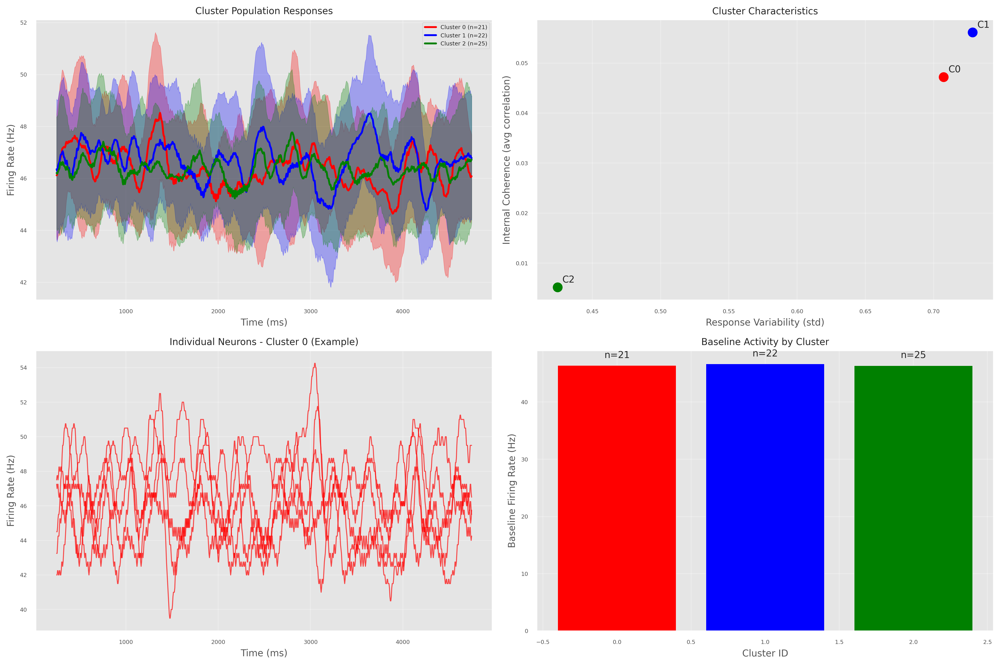

{np.int64(0): {'neurons': array([ 0,  2,  4,  7,  8, 11, 14, 16, 19, 20, 21, 26, 39, 40, 41, 45, 47,
         50, 51, 56, 60]),
  'size': 21,
  'mean_response': array([46.11904762, 46.13095238, 46.25      , 46.38095238, 46.46428571,
         46.52380952, 46.60714286, 46.71428571, 46.77380952, 46.82142857,
         46.88095238, 47.        , 47.13095238, 47.16666667, 47.17857143,
         47.20238095, 47.21428571, 47.20238095, 47.19047619, 47.23809524,
         47.3452381 , 47.4047619 , 47.39285714, 47.35714286, 47.3452381 ,
         47.4047619 , 47.42857143, 47.39285714, 47.39285714, 47.42857143,
         47.45238095, 47.44047619, 47.41666667, 47.42857143, 47.5       ,
         47.54761905, 47.54761905, 47.54761905, 47.57142857, 47.64285714,
         47.60714286, 47.52380952, 47.52380952, 47.54761905, 47.54761905,
         47.45238095, 47.4047619 , 47.39285714, 47.33333333, 47.30952381,
         47.33333333, 47.33333333, 47.28571429, 47.27380952, 47.23809524,
         47.19047619, 47.22

In [143]:
def create_cluster_based_decoder(rates_per_neuron, cluster_labels, times_vector):
    """
    Create a framework to characterize stimuli based on cluster responses
    """
    n_clusters = len(np.unique(cluster_labels))
    
    # Create cluster-based population vectors
    cluster_responses = {}
    cluster_info = {}
    
    for cluster_id in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster_id
        cluster_neurons = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]  # (n_neurons_in_cluster, n_time_bins)
        
        # Cluster population response
        cluster_mean_response = np.mean(cluster_rates, axis=0)
        cluster_std_response = np.std(cluster_rates, axis=0)
        
        # Cluster coherence (how synchronized are neurons in this cluster)
        cluster_coherence = []
        for i in range(len(cluster_neurons)):
            for j in range(i+1, len(cluster_neurons)):
                corr = np.corrcoef(cluster_rates[i], cluster_rates[j])[0, 1]
                if not np.isnan(corr):
                    cluster_coherence.append(corr)
        
        cluster_info[cluster_id] = {
            'neurons': cluster_neurons,
            'size': len(cluster_neurons),
            'mean_response': cluster_mean_response,
            'std_response': cluster_std_response,
            'baseline_rate': np.mean(cluster_mean_response),
            'variability': np.std(cluster_mean_response),
            'internal_coherence': np.mean(cluster_coherence) if cluster_coherence else 0,
            'response_dynamics': cluster_rates  # Individual neuron responses
        }
    
    return cluster_info

def plot_cluster_responses(cluster_info, times_vector, title="Cluster Responses"):
    """
    Visualize how each cluster responds over time
    """
    n_clusters = len(cluster_info)
    fig, axes = plt.subplots(2, 2, figsize=(15, 10), dpi=300)
    axes = axes.flatten()
    
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    
    # Plot 1: Mean responses
    ax1 = axes[0]
    for cluster_id, info in cluster_info.items():
        mean_resp = info['mean_response']
        std_resp = info['std_response']
        color = colors[cluster_id % len(colors)]
        
        ax1.plot(times_vector, mean_resp, color=color, linewidth=2, 
                label=f'Cluster {cluster_id} (n={info["size"]})')
        ax1.fill_between(times_vector, mean_resp - std_resp, mean_resp + std_resp, 
                        color=color, alpha=0.3)
    
    ax1.set_title('Cluster Population Responses')
    ax1.set_xlabel('Time (ms)')
    ax1.set_ylabel('Firing Rate (Hz)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Response variability
    ax2 = axes[1]
    cluster_ids = list(cluster_info.keys())
    variabilities = [cluster_info[cid]['variability'] for cid in cluster_ids]
    coherences = [cluster_info[cid]['internal_coherence'] for cid in cluster_ids]
    
    scatter = ax2.scatter(variabilities, coherences, s=100, 
                         c=[colors[i % len(colors)] for i in cluster_ids])
    
    for i, cid in enumerate(cluster_ids):
        ax2.annotate(f'C{cid}', (variabilities[i], coherences[i]), 
                    xytext=(5, 5), textcoords='offset points')
    
    ax2.set_xlabel('Response Variability (std)')
    ax2.set_ylabel('Internal Coherence (avg correlation)')
    ax2.set_title('Cluster Characteristics')
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Individual neuron responses per cluster
    ax3 = axes[2]
    for cluster_id, info in cluster_info.items():
        if cluster_id == 0:  # Show first cluster as example
            for i, neuron_response in enumerate(info['response_dynamics'][:5]):  # First 5 neurons
                ax3.plot(times_vector, neuron_response, alpha=0.7, 
                        color=colors[cluster_id % len(colors)], linewidth=1)
    
    ax3.set_title(f'Individual Neurons - Cluster 0 (Example)')
    ax3.set_xlabel('Time (ms)')
    ax3.set_ylabel('Firing Rate (Hz)')
    ax3.grid(True, alpha=0.3)
    
    # Plot 4: Baseline activity comparison
    ax4 = axes[3]
    baseline_rates = [cluster_info[cid]['baseline_rate'] for cid in cluster_ids]
    cluster_sizes = [cluster_info[cid]['size'] for cid in cluster_ids]
    
    bars = ax4.bar(cluster_ids, baseline_rates, color=[colors[i % len(colors)] for i in cluster_ids])
    
    # Add cluster size annotations
    for i, (cid, rate, size) in enumerate(zip(cluster_ids, baseline_rates, cluster_sizes)):
        ax4.text(cid, rate + max(baseline_rates)*0.02, f'n={size}', 
                ha='center', va='bottom')
    
    ax4.set_xlabel('Cluster ID')
    ax4.set_ylabel('Baseline Firing Rate (Hz)')
    ax4.set_title('Baseline Activity by Cluster')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return cluster_info

# Apply to your data
cluster_decoder = create_cluster_based_decoder(rates_per_neuronPC, clusters, times_vectorPC)

# Visualize cluster responses
plot_cluster_responses(cluster_decoder, times_vectorPC, "Purkinje Cell Clusters - Basal Activity")

In [60]:
def create_stimulus_decoder(cluster_info):
    """
    Create a decoder that can predict stimulus characteristics from cluster responses
    """
    
    def decode_activity_pattern(time_window_rates):
        """
        Decode what's happening based on cluster activity in a time window
        
        Args:
            time_window_rates: dictionary with cluster_id: average_rate_in_window
        """
        
        # Compare to baseline patterns
        predictions = {}
        
        for cluster_id, window_rate in time_window_rates.items():
            baseline_rate = cluster_info[cluster_id]['baseline_rate']
            baseline_std = cluster_info[cluster_id]['variability']
            
            # Z-score relative to baseline
            z_score = (window_rate - baseline_rate) / (baseline_std + 1e-8)
            
            if z_score > 2:
                predictions[cluster_id] = "HIGH_ACTIVATION"
            elif z_score < -2:
                predictions[cluster_id] = "SUPPRESSION"
            elif abs(z_score) < 0.5:
                predictions[cluster_id] = "BASELINE"
            else:
                predictions[cluster_id] = "MODERATE_CHANGE"
        
        return predictions
    
    def analyze_temporal_pattern(start_time, end_time, times_vector):
        """
        Analyze the temporal pattern of cluster responses in a specific time window
        """
        start_idx = np.argmin(np.abs(times_vector - start_time))
        end_idx = np.argmin(np.abs(times_vector - end_time))
        
        window_responses = {}
        for cluster_id, info in cluster_info.items():
            window_response = info['mean_response'][start_idx:end_idx]
            window_responses[cluster_id] = {
                'mean_rate': np.mean(window_response),
                'peak_rate': np.max(window_response),
                'min_rate': np.min(window_response),
                'response_pattern': window_response
            }
        
        # Decode the pattern
        window_rates = {cid: resp['mean_rate'] for cid, resp in window_responses.items()}
        decoded_pattern = decode_activity_pattern(window_rates)
        
        return window_responses, decoded_pattern
    
    return analyze_temporal_pattern

# Create decoder
stimulus_decoder = create_stimulus_decoder(cluster_decoder)

# Example: Analyze a specific time window
example_window_start = 300  # ms
example_window_end = 400    # ms

window_analysis, decoded_pattern = stimulus_decoder(example_window_start, example_window_end, times_vectorPC)

print(f"=== DECODING TIME WINDOW {example_window_start}-{example_window_end} ms ===")
for cluster_id, pattern in decoded_pattern.items():
    rate_info = window_analysis[cluster_id]
    print(f"Cluster {cluster_id}: {pattern}")
    print(f"  Mean rate: {rate_info['mean_rate']:.2f} Hz")
    print(f"  Peak rate: {rate_info['peak_rate']:.2f} Hz")

NameError: name 'cluster_decoder' is not defined


🔹 DIRECT K-MEANS CLUSTERING ANALYSIS
Cluster distribution: {np.int32(0): np.int64(29), np.int32(1): np.int64(18), np.int32(2): np.int64(21)}


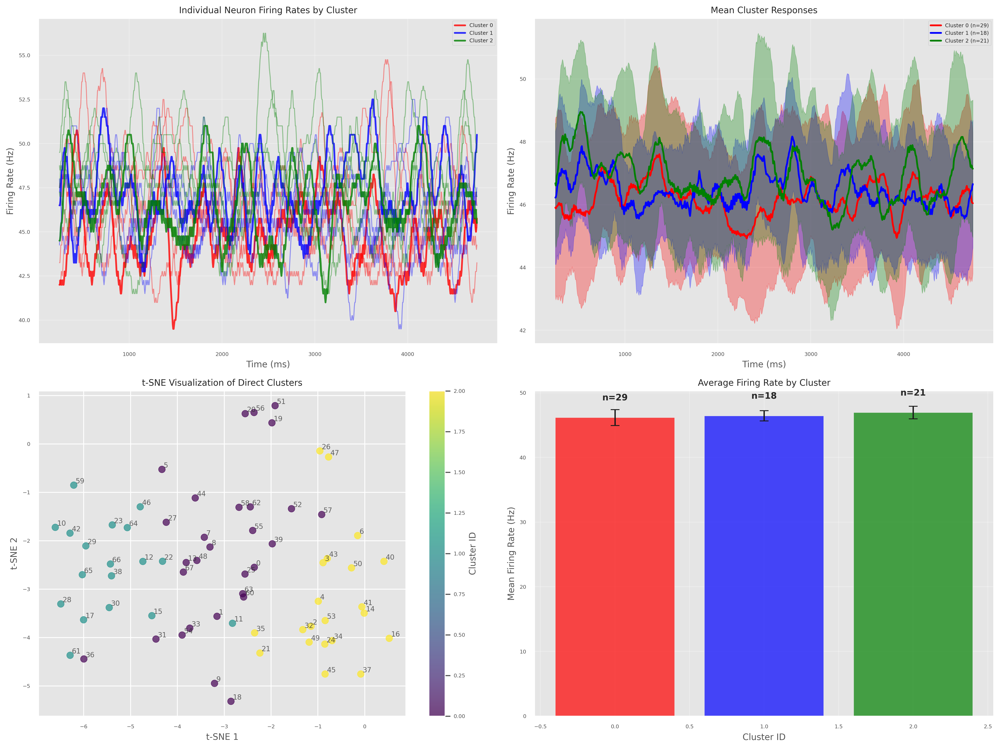


🔹 DETAILED CLUSTER ANALYSIS
--------------------------------------------------

Cluster 0: 29 neurons
  Neuron indices: [ 0  1  5  7  8  9 13 18 19 20]...
  Mean firing rate: 46.16 ± 1.22 Hz
  Rate range: 43.93 - 48.98 Hz
  Temporal variability: 2.25 ± 0.21

Cluster 1: 18 neurons
  Neuron indices: [10 11 12 15 17 22 23 28 29 30]...
  Mean firing rate: 46.44 ± 0.78 Hz
  Rate range: 44.23 - 47.62 Hz
  Temporal variability: 1.92 ± 0.19

Cluster 2: 21 neurons
  Neuron indices: [ 2  3  4  6 14 16 21 24 26 32]...
  Mean firing rate: 46.93 ± 0.97 Hz
  Rate range: 45.38 - 48.94 Hz
  Temporal variability: 2.37 ± 0.20


In [61]:
def direct_clustering_analysis(combined_features, rates_per_neuron, times_vector, n_clusters=3):
    """
    Perform direct K-means clustering and analyze individual neuron responses
    """
    from sklearn.preprocessing import StandardScaler
    from sklearn.cluster import KMeans
    from sklearn.manifold import TSNE
    
    print("\n🔹 DIRECT K-MEANS CLUSTERING ANALYSIS")
    print("="*60)
    
    # 1. Standardize and cluster
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(combined_features)
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    direct_clusters = kmeans.fit_predict(features_scaled)
    
    # Print cluster distribution
    unique_clusters, counts = np.unique(direct_clusters, return_counts=True)
    print(f"Cluster distribution: {dict(zip(unique_clusters, counts))}")
    
    # 2. Individual neuron firing rate analysis per cluster
    colors = ['red', 'blue', 'green', 'orange', 'purple']
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
    
    # Plot individual neuron responses for each cluster
    ax1 = axes[0, 0]
    ax1.set_title('Individual Neuron Firing Rates by Cluster')
    
    for cluster_id in unique_clusters:
        cluster_mask = direct_clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        color = colors[cluster_id % len(colors)]
        
        # Plot first few neurons from each cluster
        n_neurons_to_plot = min(5, len(cluster_neurons))
        for i in range(n_neurons_to_plot):
            alpha = 0.8 if i == 0 else 0.4  # Make first neuron more visible
            linewidth = 2 if i == 0 else 1
            label = f'Cluster {cluster_id}' if i == 0 else None
            ax1.plot(times_vector, cluster_neurons[i], 
                    color=color, alpha=alpha, linewidth=linewidth, label=label)
    
    ax1.set_xlabel('Time (ms)')
    ax1.set_ylabel('Firing Rate (Hz)')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot cluster mean responses
    ax2 = axes[0, 1]
    ax2.set_title('Mean Cluster Responses')
    
    for cluster_id in unique_clusters:
        cluster_mask = direct_clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        color = colors[cluster_id % len(colors)]
        
        mean_response = np.mean(cluster_neurons, axis=0)
        std_response = np.std(cluster_neurons, axis=0)
        
        ax2.plot(times_vector, mean_response, color=color, linewidth=2,
                label=f'Cluster {cluster_id} (n={np.sum(cluster_mask)})')
        ax2.fill_between(times_vector, mean_response - std_response, 
                        mean_response + std_response, color=color, alpha=0.3)
    
    ax2.set_xlabel('Time (ms)')
    ax2.set_ylabel('Firing Rate (Hz)')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # t-SNE visualization
    ax3 = axes[1, 0]
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(combined_features)-1))
    features_tsne = tsne.fit_transform(features_scaled)
    
    scatter = ax3.scatter(features_tsne[:, 0], features_tsne[:, 1], 
                         c=direct_clusters, cmap='viridis', alpha=0.7, s=60)
    
    # Add neuron labels
    for i, (x, y) in enumerate(features_tsne):
        ax3.annotate(f'{i}', (x, y), xytext=(2, 2), 
                   textcoords='offset points', fontsize=8, alpha=0.7)
    
    ax3.set_title('t-SNE Visualization of Direct Clusters')
    ax3.set_xlabel('t-SNE 1')
    ax3.set_ylabel('t-SNE 2')
    plt.colorbar(scatter, ax=ax3, label='Cluster ID')
    
    # Cluster size and firing rate comparison
    ax4 = axes[1, 1]
    
    mean_rates_per_cluster = []
    std_rates_per_cluster = []
    cluster_sizes = []
    
    for cluster_id in unique_clusters:
        cluster_mask = direct_clusters == cluster_id
        cluster_neurons = rates_per_neuron[cluster_mask]
        
        # Mean firing rate across all neurons in cluster
        cluster_mean_rates = np.mean(cluster_neurons, axis=1)  # Mean across time for each neuron
        mean_rates_per_cluster.append(np.mean(cluster_mean_rates))
        std_rates_per_cluster.append(np.std(cluster_mean_rates))
        cluster_sizes.append(np.sum(cluster_mask))
    
    bars = ax4.bar(unique_clusters, mean_rates_per_cluster, 
                   yerr=std_rates_per_cluster,
                   color=[colors[i % len(colors)] for i in unique_clusters],
                   alpha=0.7, capsize=5)
    
    # Add cluster size annotations
    for i, (cluster_id, rate, size) in enumerate(zip(unique_clusters, mean_rates_per_cluster, cluster_sizes)):
        ax4.text(cluster_id, rate + max(mean_rates_per_cluster)*0.05, f'n={size}', 
                ha='center', va='bottom', fontweight='bold')
    
    ax4.set_xlabel('Cluster ID')
    ax4.set_ylabel('Mean Firing Rate (Hz)')
    ax4.set_title('Average Firing Rate by Cluster')
    ax4.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed cluster analysis
    print(f"\n🔹 DETAILED CLUSTER ANALYSIS")
    print("-" * 50)
    
    for cluster_id in unique_clusters:
        cluster_mask = direct_clusters == cluster_id
        cluster_neurons_indices = np.where(cluster_mask)[0]
        cluster_rates = rates_per_neuron[cluster_mask]
        
        print(f"\nCluster {cluster_id}: {np.sum(cluster_mask)} neurons")
        print(f"  Neuron indices: {cluster_neurons_indices[:10]}{'...' if len(cluster_neurons_indices) > 10 else ''}")
        
        # Firing rate statistics
        mean_rates = np.mean(cluster_rates, axis=1)
        print(f"  Mean firing rate: {np.mean(mean_rates):.2f} ± {np.std(mean_rates):.2f} Hz")
        print(f"  Rate range: {np.min(mean_rates):.2f} - {np.max(mean_rates):.2f} Hz")
        
        # Temporal variability
        temporal_variability = np.std(cluster_rates, axis=1)
        print(f"  Temporal variability: {np.mean(temporal_variability):.2f} ± {np.std(temporal_variability):.2f}")
    
    return direct_clusters, features_tsne

# Run the direct clustering analysis
direct_clusters, tsne_coords = direct_clustering_analysis(
    combined_features_corr, 
    rates_per_neuronPC, 
    times_vectorPC, 
    n_clusters=3
)

In [63]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, adjusted_rand_score
import numpy as np
from sklearn.manifold import TSNE

def determine_optimal_clusters(combine_features, max_k=10):
    """
    Determine optimal number of clusters using multiple methods
    """
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(combine_features)

    inertias = []
    silhouette_scores = []
    calinski_scores = []
    
    k_range = range(2, max_k + 1)
    
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(features_scaled)
        
        inertias.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(features_scaled, clusters))
        calinski_scores.append(calinski_harabasz_score(features_scaled, clusters))
    
    # Plot elbow method and silhouette analysis
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Elbow method
    axes[0].plot(k_range, inertias, 'bo-')
    axes[0].set_title('Elbow Method')
    axes[0].set_xlabel('Number of Clusters (k)')
    axes[0].set_ylabel('Inertia')
    
    # Silhouette scores
    axes[1].plot(k_range, silhouette_scores, 'ro-')
    axes[1].set_title('Silhouette Analysis')
    axes[1].set_xlabel('Number of Clusters (k)')
    axes[1].set_ylabel('Silhouette Score')
    
    # Calinski-Harabasz scores
    axes[2].plot(k_range, calinski_scores, 'go-')
    axes[2].set_title('Calinski-Harabasz Index')
    axes[2].set_xlabel('Number of Clusters (k)')
    axes[2].set_ylabel('CH Score')
    
    plt.tight_layout()
    plt.show()
    
    return k_range, silhouette_scores, calinski_scores


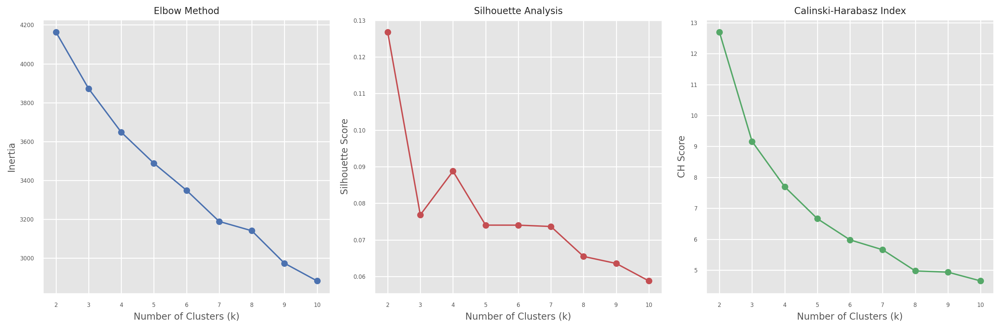

In [64]:
k_range, silhouette_scores, calinski_scores = determine_optimal_clusters(combined_features_corr, max_k=10)

In [121]:
analyze_cluster_feature_contributions(
    combined_features_corr, 
    direct_clusters, 
    feature_names=['pca_corr', 'neuron_corr', 'spectral']
)

CLUSTER FEATURE ANALYSIS
Total features: 79

🔹 CLUSTER 0 (29 neurons)
----------------------------------------
PCA_projections:
  Mean: 0.8997 ± 14.0831
  Range: [-7.0796, 6.4107]
  Features: 0-14
Reference_correlations:
  Mean: 0.0020 ± 0.1449
  Range: [-0.0543, 0.0844]
  Features: 15-34
Population_correlation:
  Mean: 0.1450 ± 0.1339
  Range: [0.1450, 0.1450]
  Features: 35-35
Autocorrelation_patterns:
  Mean: -0.0000 ± 0.0128
  Range: [-1.7718, 1.3109]
  Features: 36-55
Temporal_dynamics:
  Mean: 4.4741 ± 0.0060
  Range: [0.1063, 34.8917]
  Features: 56-63
PCA_variance:
  Mean: 5.3695 ± 4.5059
  Range: [0.1054, 15.5097]
  Features: 64-67
FOOOF_spectral:
  Mean: 8.8454 ± 4.4737
  Range: [0.5911, 31.0761]
  Features: 68-82

  Most distinctive features (Cohen's d):
    Feature 0 (PCA_projections): d = -1.172
    Feature 29 (Reference_correlations): d = -0.833
    Feature 68 (FOOOF_spectral): d = 0.795
    Feature 34 (Reference_correlations): d = -0.762
    Feature 31 (Reference_correla